# `Defining & Solving RL Environments`

### `Part 1: Defining RL Environments`

`Environment Scenario :` I am implementing a Warehouse Robot Scenario which operates in a warehouse grid where its task is to pick up items from specified locations and deliver them to designated drop-off points. The warehouse has shelves that act as obstacles, and the robot must navigate around them efficiently.

`Base Setup :` 
- Grid size: 6x6 grid
- Obstacles: Shelves (static obstacles) that block the robot’s path
- Goal : The robot must pick up an item from an assigned location and deliver it to another specified location
- Actions : Up, Down, Left, Right, Pick-up, Drop-off
- Rewards : `+100pts` for successful delivery, `+25` points for picking up the object the first time, `-1pt` for each step taken to encourage efficiency, `-20pts` for hitting an obstacle, `-2pts` for making invalid actions(for e.g. trying to drop without the box)

`Unique Implementation:`
- The robot has all 6 actions available in the entirety of the episodes, so if the robot carries the object to a place other than drop location and drops it, the box location changes too. Trying to mimic real world scenario as close as possible.

In [54]:
#Import the neccesary libraries
import os
import numpy as np
import gymnasium as gym
from gymnasium import spaces
import matplotlib.pyplot as plt
import random
import pickle
import copy

In [55]:
%matplotlib inline

### `Deterministic Environment:`

In [56]:
class WarehouseRobotDeterministicEnv(gym.Env):
    
    metadata = {'render.modes': ['human']}

    #Helper function to return the observation space of the robot
    def _get_obs(self):
        return (tuple(self.agent_pos), self.box, self.carrying_item)

    def seed(self, seed=None):
        self.np_random, seed = gym.utils.seeding.np_random(seed)
        self.np_random_seed = seed
        return [seed]

    def __init__(self):
        super(WarehouseRobotDeterministicEnv, self).__init__()

        #Environment configuration
        self.grid_size = 6

        #Actions
        self.action_space = spaces.Discrete(6)

        
        self.observation_space = spaces.Tuple((
            spaces.Tuple((
                spaces.Discrete(self.grid_size),  
                spaces.Discrete(self.grid_size)   
            )),
            spaces.Tuple((
                spaces.Discrete(self.grid_size),  
                spaces.Discrete(self.grid_size)   
            )),
            spaces.Discrete(2)                   
        ))

        #Warehouse grid setup
        self.shelves = [(2, 2), (3, 3), (1, 4)]  #Initializes static shelves as obstacles
        self.dropoff_location = (5, 5)

        #Initializes the environment’s internal random generator.
        self.np_random, seed = gym.utils.seeding.np_random(None)
        self._np_random_seed = seed

        #Loads real-world images for rendering
        self.background_img = plt.imread('Env_Images/background.jpeg') if os.path.exists('Env_Images/background.jpeg') else np.ones((100, 100, 3)) * 0.8
        self.robot_img = plt.imread('Env_Images/idle.png') 
        self.box_img = plt.imread('Env_Images/box.png') 
        self.droploc = plt.imread('Env_Images/dropoff.png')
        self.robot_carrying_img = plt.imread('Env_Images/carryingbox.png') 
        self.shelf_img = plt.imread('Env_Images/shelves.png') 
        self.boxandrobot = plt.imread('Env_Images/boxandrobot.png') 
        self.final1 = plt.imread('Env_Images/final1.png')
        self.final2 = plt.imread('Env_Images/final2.png')
        self.final0 = plt.imread('Env_Images/final0.png')
        
        self.reset()

    def reset(self):
        self.agent_pos = [5, 0]       #Start position
        self.box = (0, 0)             #Box location
        self.carrying_item = 0        #Not carrying any object
        self.first = 1                #the bool flag to know if the box picked up is the first time or not (1: first time 0: not first time)
        self.steps = 0
        self.isinfinalwithbox = 0     # 0 : when it has entered without box 1 : when entered with box
        return self._get_obs(), {}

    def step(self, action):
        initial_pos = self.agent_pos.copy()
        self.steps += 1
        reward = -1
        terminated = False
        truncated = False

        #Define actions
        if action == 0:  #Up
            if self.agent_pos[1] < self.grid_size - 1:
                self.agent_pos[1] += 1
            if tuple(self.agent_pos) in self.shelves:     #Handles crashing into shelves
                self.agent_pos = initial_pos
                reward = -20
        elif action == 1:  #Down
            if self.agent_pos[1] > 0:
                self.agent_pos[1] -= 1
            if tuple(self.agent_pos) in self.shelves:
                self.agent_pos = initial_pos
                reward = -20
        elif action == 2:  #Left
            if self.agent_pos[0] > 0:
                self.agent_pos[0] -= 1
            if tuple(self.agent_pos) in self.shelves:
                self.agent_pos = initial_pos
                reward = -20
        elif action == 3:  #Right
            if self.agent_pos[0] < self.grid_size - 1:
                self.agent_pos[0] += 1
            if tuple(self.agent_pos) in self.shelves:
                self.agent_pos = initial_pos
                reward = -20

        if self.carrying_item == 1:
            self.box = tuple(self.agent_pos)        #when the agent has the box and tries to move
                
        if action == 4:  #Pick-up
            if tuple(self.agent_pos) == self.box and self.carrying_item == 0:
                if self.first == 1:
                    self.carrying_item = 1
                    reward = 25
                    self.first = 0
                else:
                    self.carrying_item = 1
                    reward = 0                 #give 0 as reward the next time
            else:
                reward = -2                    #when it tries to pick up in other locations other than the box spots
                    
        elif action == 5:  #Drop-off
            if tuple(self.agent_pos) == self.dropoff_location and self.carrying_item == 1:
                self.carrying_item = 0
                reward = 100
                terminated = True
            elif self.carrying_item == 1:
                x,y = self.agent_pos
                self.box = (x,y)
                self.carrying_item = 0
                reward = -5                   #when tries to drop in other locations other than drop off
            else:
                reward = -2                   #when it tries to drop simply without box

        if tuple(self.agent_pos) == self.dropoff_location and self.carrying_item == 1:
            self.isinfinalwithbox = 1

        return self._get_obs(), reward, terminated, truncated, {}

    def render(self, mode='human'):
        #Initializes the plot
        fig, ax = plt.subplots(figsize=(6, 6))
        
        #Sets the axis limits so that (0,0) is at bottom left
        ax.set_xlim(0, self.grid_size)
        ax.set_ylim(0, self.grid_size)
        ax.set_xticks(np.arange(0, self.grid_size + 1, 1))
        ax.set_yticks(np.arange(0, self.grid_size + 1, 1))
        ax.grid(True, which='both', color='black', linestyle='-', linewidth=1)
        ax.set_aspect('equal')

        #Draws the background image over the entire grid
        ax.imshow(self.background_img, extent=(0, self.grid_size, 0, self.grid_size))

        #Overlays the shelves
        for shelf in self.shelves:
            x, y = shelf
            if self.shelf_img is not None:
                ax.imshow(self.shelf_img, extent=(x, x + 1, y, y + 1))
            else:
                rect = plt.Rectangle((x, y), 1, 1, color='brown')
                ax.add_patch(rect)

        #Overlays the drop location mechanism
        if tuple(self.agent_pos) != self.dropoff_location:
            x,y = self.dropoff_location
            ax.imshow(self.droploc, extent=(x, x + 1, y, y + 1))
        
        #Overlays the box location
        if tuple(self.agent_pos) != self.box:
            x, y = self.box
            if self.box_img is not None:
                ax.imshow(self.box_img, extent=(x, x + 1, y, y + 1))
            else:
                rect = plt.Rectangle((x, y), 1, 1, color='green')
                ax.add_patch(rect)

        #Draws the agent
        x, y = self.agent_pos

        if tuple(self.agent_pos) == self.box and tuple(self.agent_pos) == self.dropoff_location:
            if self.carrying_item == 1:
                ax.imshow(self.final1 ,extent=(x, x + 1, y, y + 1))
            else:
                ax.imshow(self.final0 ,extent=(x, x + 1, y, y + 1))
        elif tuple(self.agent_pos) == self.box and tuple(self.agent_pos) != self.dropoff_location:
            if self.carrying_item == 1:
                ax.imshow(self.robot_carrying_img, extent=(x, x + 1, y, y + 1))
            else:
                ax.imshow(self.boxandrobot, extent=(x, x + 1, y, y + 1))
        elif tuple(self.agent_pos) == self.dropoff_location:
             x,y = self.dropoff_location
             if self.isinfinalwithbox == 0:
                ax.imshow(self.final0 ,extent=(x, x + 1, y, y + 1))
                    
        if tuple(self.agent_pos) != self.box and tuple(self.agent_pos) != self.dropoff_location:
            if self.robot_img is not None:
                ax.imshow(self.robot_img, extent=(x, x + 1, y, y + 1))
            else:
                circ = plt.Circle((x + 0.5, y + 0.5), 0.3, color='red')
                ax.add_patch(circ)

        ax.set_title('Warehouse Robot')
        plt.show()


In [57]:
#Creates a helper function to run the different kinds of environments based on input number of episodes
def run_environment(env,n=10):
    print("Running environment...")
    obs = env.reset()
    print("Loading primary state of the environment...")
    env.render()
    print("\n")
    print("-"*65)
    for step in range(n):
        action = env.action_space.sample()
        obs, reward, done, _, _ = env.step(action)
        print(f"Step: {step + 1}, State: {obs}, Action: {action}, Reward: {reward}")
        env.render()
        if done:
            print("Episode finished after {} steps".format(step + 1))
            break

------------Deterministic Environment-----------
Running environment...
Loading primary state of the environment...


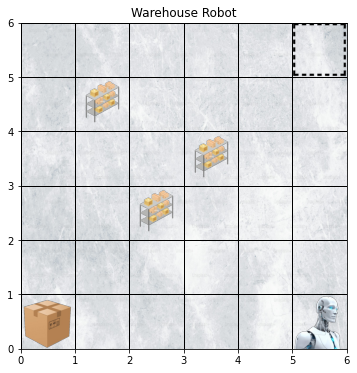



-----------------------------------------------------------------
Step: 1, State: ((5, 0), (0, 0), 0), Action: 4, Reward: -2


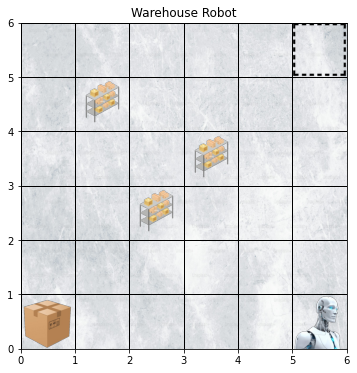

Step: 2, State: ((5, 0), (0, 0), 0), Action: 5, Reward: -2


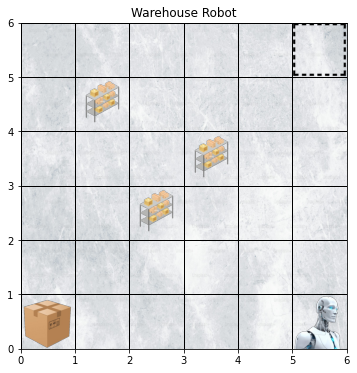

Step: 3, State: ((5, 0), (0, 0), 0), Action: 3, Reward: -1


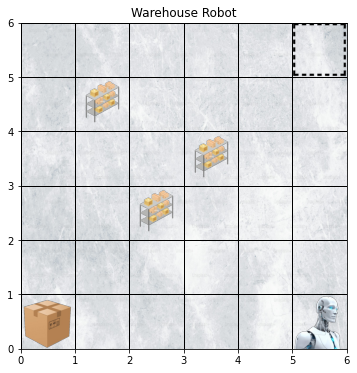

Step: 4, State: ((4, 0), (0, 0), 0), Action: 2, Reward: -1


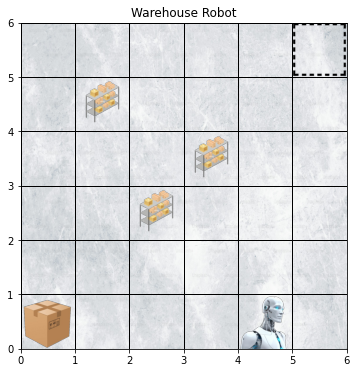

Step: 5, State: ((3, 0), (0, 0), 0), Action: 2, Reward: -1


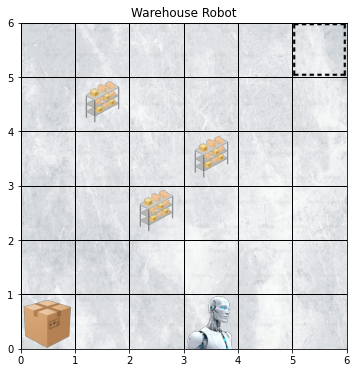

Step: 6, State: ((3, 0), (0, 0), 0), Action: 1, Reward: -1


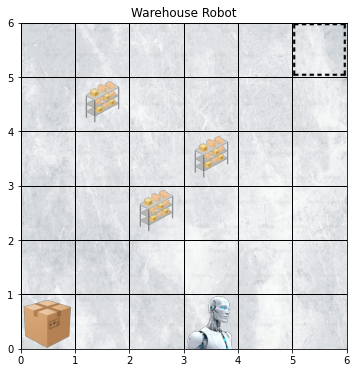

Step: 7, State: ((3, 0), (0, 0), 0), Action: 1, Reward: -1


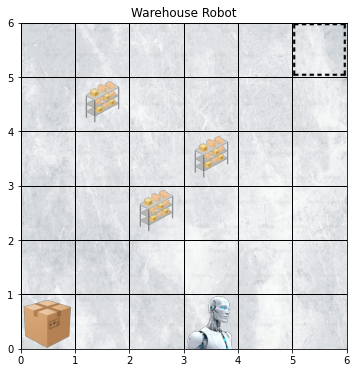

Step: 8, State: ((3, 0), (0, 0), 0), Action: 1, Reward: -1


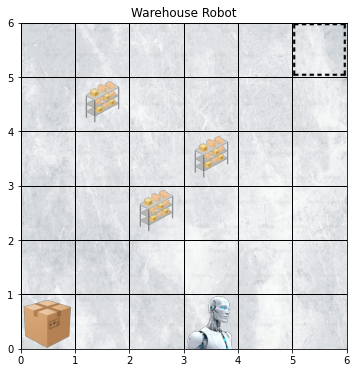

Step: 9, State: ((3, 0), (0, 0), 0), Action: 4, Reward: -2


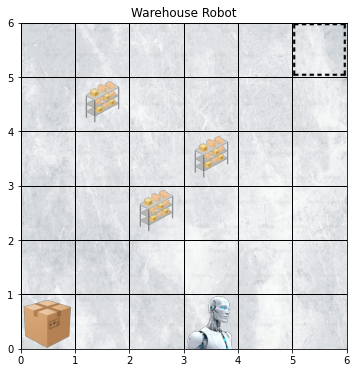

Step: 10, State: ((2, 0), (0, 0), 0), Action: 2, Reward: -1


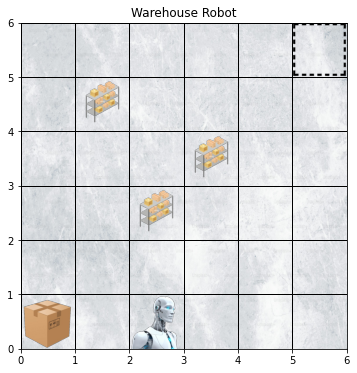

In [58]:
#Running the Deterministic Environment for 10 steps

print("------------Deterministic Environment-----------")
deterministic_env = WarehouseRobotDeterministicEnv()
run_environment(deterministic_env,10)

Running environment...


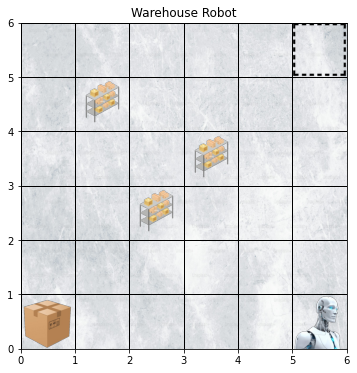

Step: 1, State: ((4, 0), (0, 0), 0), Action: 2, Reward: -1


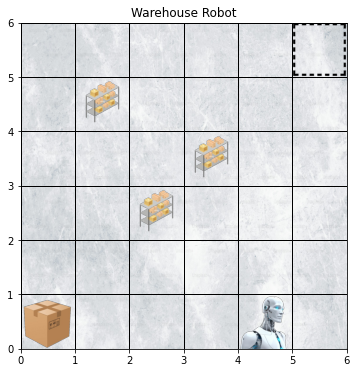

Step: 2, State: ((3, 0), (0, 0), 0), Action: 2, Reward: -1


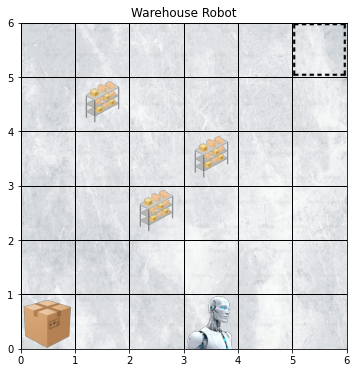

Step: 3, State: ((2, 0), (0, 0), 0), Action: 2, Reward: -1


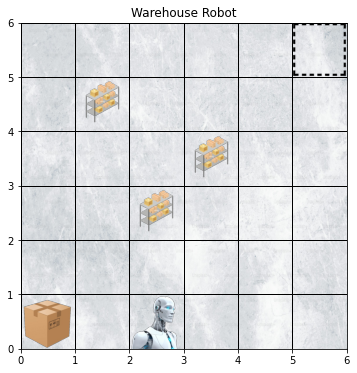

Step: 4, State: ((1, 0), (0, 0), 0), Action: 2, Reward: -1


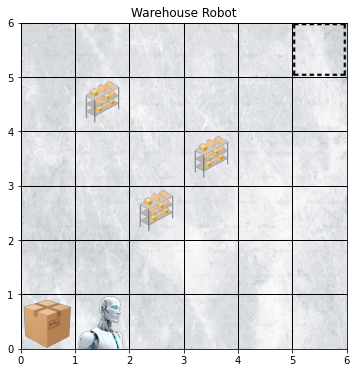

Step: 5, State: ((0, 0), (0, 0), 0), Action: 2, Reward: -1


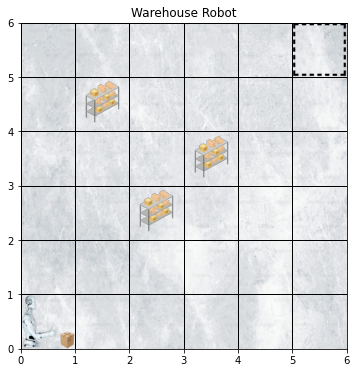

Step: 6, State: ((0, 0), (0, 0), 1), Action: 4, Reward: 25


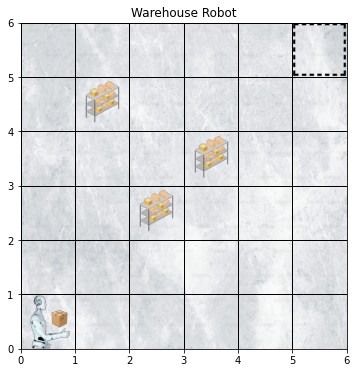

Step: 7, State: ((1, 0), (1, 0), 1), Action: 3, Reward: -1


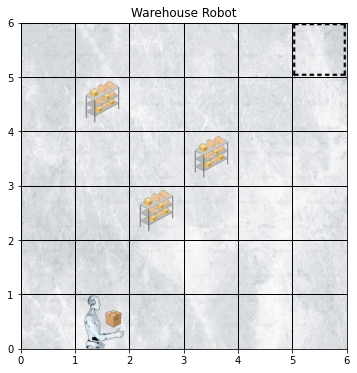

Step: 8, State: ((2, 0), (2, 0), 1), Action: 3, Reward: -1


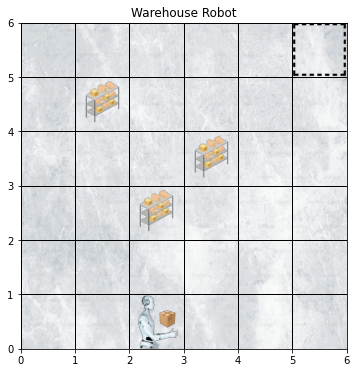

Step: 9, State: ((3, 0), (3, 0), 1), Action: 3, Reward: -1


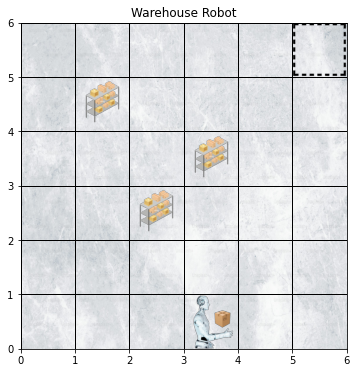

Step: 10, State: ((4, 0), (4, 0), 1), Action: 3, Reward: -1


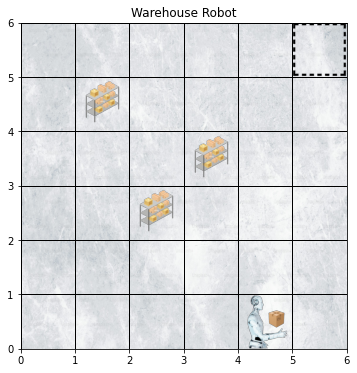

Step: 11, State: ((5, 0), (5, 0), 1), Action: 3, Reward: -1


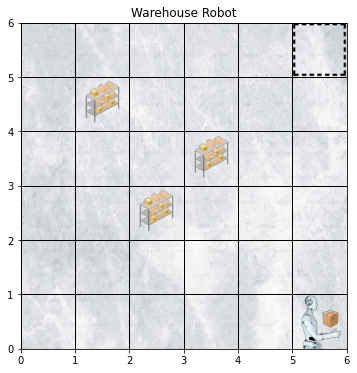

Step: 12, State: ((5, 1), (5, 1), 1), Action: 0, Reward: -1


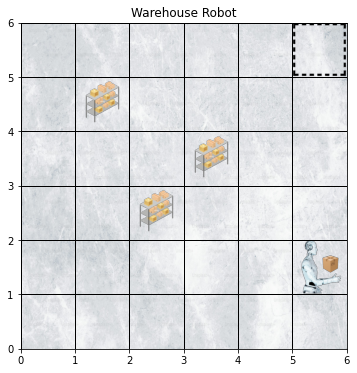

Step: 13, State: ((5, 2), (5, 2), 1), Action: 0, Reward: -1


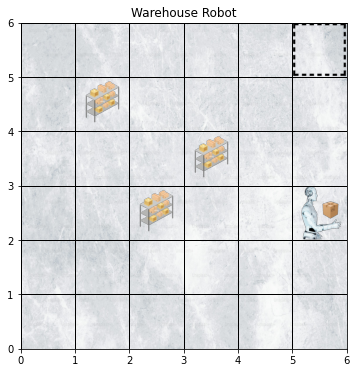

Step: 14, State: ((5, 3), (5, 3), 1), Action: 0, Reward: -1


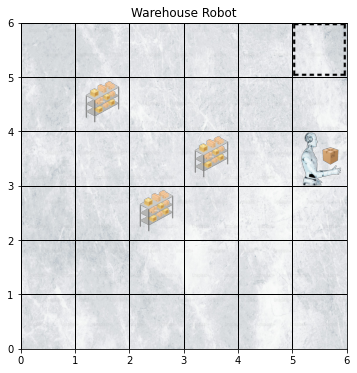

Step: 15, State: ((5, 4), (5, 4), 1), Action: 0, Reward: -1


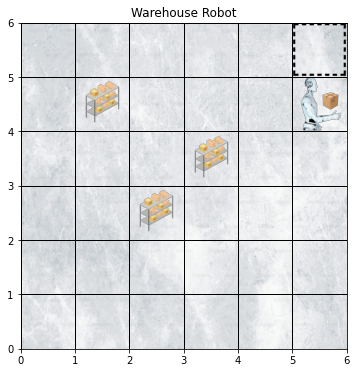

Step: 16, State: ((5, 5), (5, 5), 1), Action: 0, Reward: -1


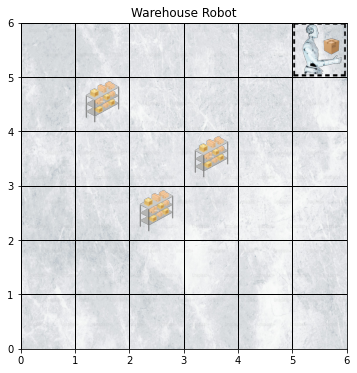

Step: 17, State: ((5, 5), (5, 5), 0), Action: 5, Reward: 100


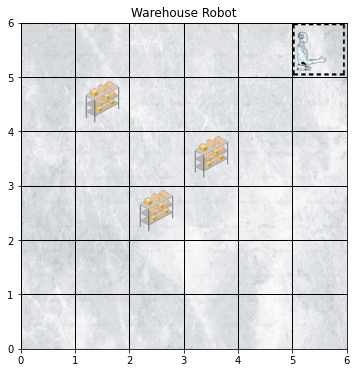

Episode finished after 17 steps


In [59]:
#Debugger use to find all actions and it's output
action_s = (2,2,2,2,2,4,3,3,3,3,3,0,0,0,0,0,5)
env = WarehouseRobotDeterministicEnv()

print("Running environment...")
obs = env.reset()
env.render()
i = 0
for step in range(len(action_s)):
    action = action_s[i]
    i = i + 1
    obs, reward, done, _, _ = env.step(action)
    print(f"Step: {step + 1}, State: {obs}, Action: {action}, Reward: {reward}")
    env.render()
    if done:
        print("Episode finished after {} steps".format(step + 1))
        break

### `Stochastic Environment:`

In [60]:
#Inherit most of the deterministic env part and implement stochastic env
class WarehouseRobotStochasticEnv(WarehouseRobotDeterministicEnv):

    def __init__(self):
        super(WarehouseRobotStochasticEnv, self).__init__()

    def step(self, action):
        self.steps += 1
        reward = -1
        done = False

        #Stochastic movement logic with higher randomness
        if self.np_random.random() < 0.2:                  #20% chance of random action
            orig_action = action
            action = self.np_random.choice([0, 1, 2, 3, 4, 5])
            self.s_log = f"Stochastic movement: original action {orig_action} changed to {action}"
        else:
            self.s_log = None
        
        initial_pos = self.agent_pos.copy()
        self.steps += 1
        reward = -1
        done = False

        #Define actions
        if action == 0:  #Up
            if self.agent_pos[1] < self.grid_size - 1:
                self.agent_pos[1] += 1
            if tuple(self.agent_pos) in self.shelves:     #Handles crashing into shelves
                self.agent_pos = initial_pos
                reward = -20
        elif action == 1:  #Down
            if self.agent_pos[1] > 0:
                self.agent_pos[1] -= 1
            if tuple(self.agent_pos) in self.shelves:
                self.agent_pos = initial_pos
                reward = -20
        elif action == 2:  #Left
            if self.agent_pos[0] > 0:
                self.agent_pos[0] -= 1
            if tuple(self.agent_pos) in self.shelves:
                self.agent_pos = initial_pos
                reward = -20
        elif action == 3:  #Right
            if self.agent_pos[0] < self.grid_size - 1:
                self.agent_pos[0] += 1
            if tuple(self.agent_pos) in self.shelves:
                self.agent_pos = initial_pos
                reward = -20

        if self.carrying_item == 1:
            self.box = tuple(self.agent_pos)        #when the agent has the box and tries to move
                
        if action == 4:  #Pick-up
            if tuple(self.agent_pos) == self.box and self.carrying_item == 0:
                if self.first == 1:
                    self.carrying_item = 1
                    reward = 25
                    self.first = 0
                else:
                    self.carrying_item = 1
                    reward = 0                 #give 0 as reward the next time
            else:
                reward = -2                    #when it tries to pick up in other locations other than the box spots
                    
        elif action == 5:  #Drop-off
            if tuple(self.agent_pos) == self.dropoff_location and self.carrying_item == 1:
                self.carrying_item = 0
                reward = 100
                done = True
            elif self.carrying_item == 1:
                x,y = self.agent_pos
                self.box = (x,y)
                self.carrying_item = 0
                reward = -5                   #when tries to drop in other locations other than drop off
            else:
                reward = -2                   #when it tries to drop simply without box

        if tuple(self.agent_pos) == self.dropoff_location and self.carrying_item == 1:
            self.isinfinalwithbox = 1

        return self._get_obs(), reward, done, False, {}

    def render(self, mode='human'):
        super().render(mode)
        #Using log to help better understand the robots movements
        if hasattr(self, 's_log') and self.s_log is not None:
            print(self.s_log)
            print("-"*60)
            self.s_log = None

------------Stochastic Environment-----------
Running environment...
Loading primary state of the environment...


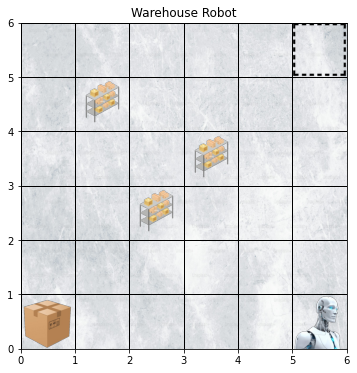



-----------------------------------------------------------------
Step: 1, State: ((5, 0), (0, 0), 0), Action: 4, Reward: -2


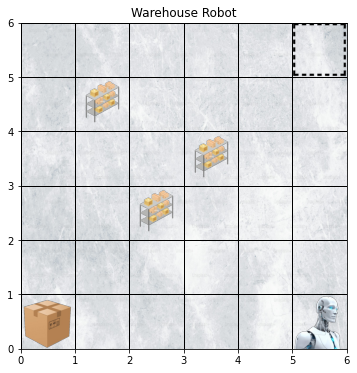

Step: 2, State: ((5, 1), (0, 0), 0), Action: 0, Reward: -1


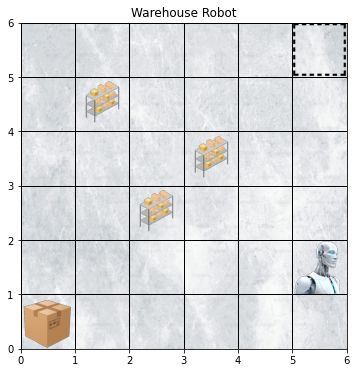

Step: 3, State: ((5, 2), (0, 0), 0), Action: 0, Reward: -1


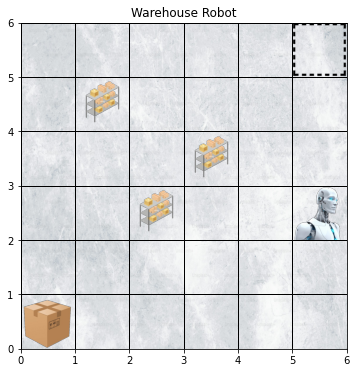

Step: 4, State: ((5, 2), (0, 0), 0), Action: 3, Reward: -1


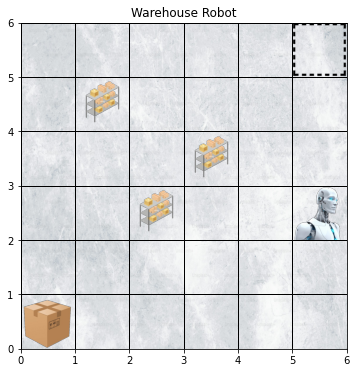

Step: 5, State: ((5, 2), (0, 0), 0), Action: 0, Reward: -2


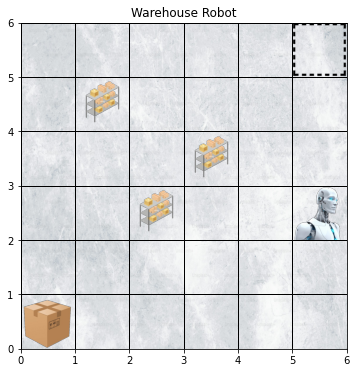

Stochastic movement: original action 0 changed to 4
------------------------------------------------------------
Step: 6, State: ((5, 2), (0, 0), 0), Action: 4, Reward: -2


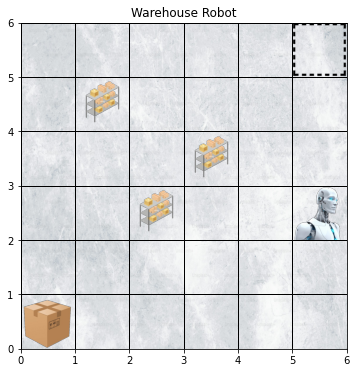

Step: 7, State: ((4, 2), (0, 0), 0), Action: 2, Reward: -1


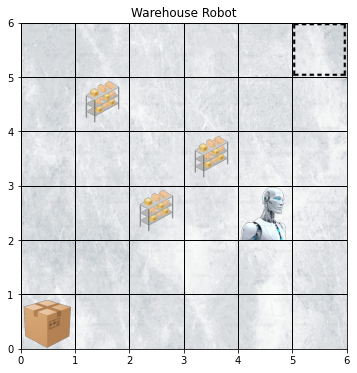

Step: 8, State: ((4, 3), (0, 0), 0), Action: 0, Reward: -1


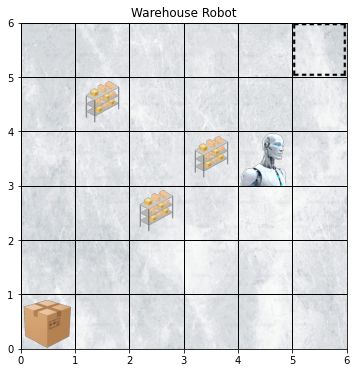

Step: 9, State: ((4, 3), (0, 0), 0), Action: 4, Reward: -2


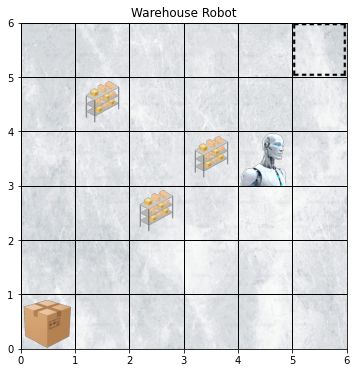

Step: 10, State: ((4, 3), (0, 0), 0), Action: 4, Reward: -2


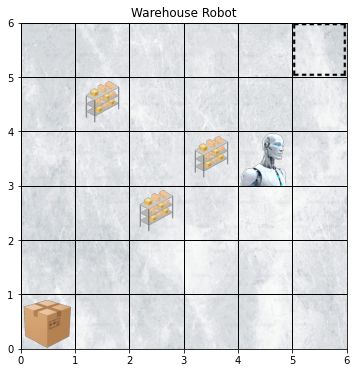

In [61]:
#Running the Stochastic Environment for 10 steps

print("------------Stochastic Environment-----------")
stochastic_env = WarehouseRobotStochasticEnv()
run_environment(stochastic_env ,10)

In [62]:
class WarehouseRobotMultiBoxEnv(gym.Env):
    metadata = {'render.modes': ['human']}

    def __init__(self, grid_size=6, num_boxes=3, max_steps=200):
        super(WarehouseRobotMultiBoxEnv, self).__init__()

        self.grid_size = grid_size
        self.num_boxes = num_boxes
        self.max_steps = max_steps

        self.action_space = spaces.Discrete(6)
        
        self.observation_space = spaces.Dict({
            "agent": spaces.Box(low=0, high=self.grid_size-1, shape=(2,), dtype=np.int32),
            "carrying": spaces.Discrete(2),
            "carrying_box": spaces.Box(low=-1, high=self.num_boxes-1, shape=(1,), dtype=np.int32),
            "boxes": spaces.Box(low=-1, high=self.grid_size-1, shape=(self.num_boxes, 2), dtype=np.int32),
            "delivered": spaces.MultiBinary(self.num_boxes)
        })

        self.shelves = [(2, 2), (3, 3), (1, 4)]
        self.dropoff_location = (5, 5)

        self.np_random, seed = gym.utils.seeding.np_random(None)
        self._np_random_seed = seed

        self.background_img = (
            plt.imread('Env_Images/background.jpeg') if os.path.exists('Env_Images/background.jpeg') else np.ones((100, 100, 3)) * 0.8)
        self.robot_img = plt.imread('Env_Images/idle.png') 
        self.box_img = plt.imread('Env_Images/box.png') 
        self.droploc = plt.imread('Env_Images/dropoff.png')
        self.robot_carrying_img = plt.imread('Env_Images/carryingbox.png') 
        self.shelf_img = plt.imread('Env_Images/shelves.png') 
        self.boxandrobot = plt.imread('Env_Images/boxandrobot.png') 
        self.final1 = plt.imread('Env_Images/final1.png')
        self.final0 = plt.imread('Env_Images/final0.png')

        self.reset()

    def random_box_location(self, existing_positions):
        while True:
            pos = (int(self.np_random.integers(0, self.grid_size)), 
                   int(self.np_random.integers(0, self.grid_size)))
            if (pos in self.shelves or
                pos == self.dropoff_location or
                pos == (5, 0) or
                pos in existing_positions):
                continue
            return pos

    def _get_obs(self):
        obs = {
            "agent": np.array(self.agent_pos, dtype=np.int32),
            "carrying": np.array([1 if self.carrying_box_idx is not None else 0], dtype=np.int32)[0],
            "carrying_box": np.array([self.carrying_box_idx if self.carrying_box_idx is not None else -1], dtype=np.int32),
            "boxes": np.array(self.boxes, dtype=np.int32),
            "delivered": np.array(self.delivered, dtype=np.int32)
        }
        return obs

    def reset(self):
        self.agent_pos = [5, 0]  
        self.carrying_box_idx = None  
        self.steps = 0

        self.boxes = []
        existing_positions = []
        for _ in range(self.num_boxes):
            pos = self.random_box_location(existing_positions)
            self.boxes.append(pos)
            existing_positions.append(pos)
        self.delivered = [False] * self.num_boxes

        self.first_pickup = [True] * self.num_boxes

        # Return observation and an empty info dict following Gymnasium standards.
        return self._get_obs(), {}

    def step(self, action):
        initial_pos = self.agent_pos.copy()
        self.steps += 1
        reward = -1  
        done = False

        if action == 0:  # Up
            if self.agent_pos[1] < self.grid_size - 1:
                self.agent_pos[1] += 1
            if tuple(self.agent_pos) in self.shelves:
                self.agent_pos = initial_pos
                reward = -20
        elif action == 1:  # Down
            if self.agent_pos[1] > 0:
                self.agent_pos[1] -= 1
            if tuple(self.agent_pos) in self.shelves:
                self.agent_pos = initial_pos
                reward = -20
        elif action == 2:  # Left
            if self.agent_pos[0] > 0:
                self.agent_pos[0] -= 1
            if tuple(self.agent_pos) in self.shelves:
                self.agent_pos = initial_pos
                reward = -20
        elif action == 3:  # Right
            if self.agent_pos[0] < self.grid_size - 1:
                self.agent_pos[0] += 1
            if tuple(self.agent_pos) in self.shelves:
                self.agent_pos = initial_pos
                reward = -20

        if self.carrying_box_idx is not None:
            self.boxes[self.carrying_box_idx] = tuple(self.agent_pos)

        # Action 4: Pick-up.
        if action == 4:
            if self.carrying_box_idx is None:
                for idx, box_pos in enumerate(self.boxes):
                    if not self.delivered[idx] and tuple(self.agent_pos) == box_pos:
                        self.carrying_box_idx = idx
                        if self.first_pickup[idx]:
                            reward = 25
                            self.first_pickup[idx] = False
                        else:
                            reward = 5
                        break
                else:
                    reward = -1  # No box at the current location.
            else:
                reward = -1  # Already carrying a box; cannot pick up another.
        
        # Action 5: Drop-off.
        elif action == 5:
            if self.carrying_box_idx is not None:
                if tuple(self.agent_pos) == self.dropoff_location:
                    self.delivered[self.carrying_box_idx] = True
                    #Set the box's position to a sentinel value
                    self.boxes[self.carrying_box_idx] = (-1, -1)
                    reward = 100
                    self.carrying_box_idx = None
                else:
                    self.boxes[self.carrying_box_idx] = tuple(self.agent_pos)
                    self.carrying_box_idx = None
                    reward = -5
            else:
                reward = -1 

        if all(self.delivered):
            done = True

        if self.steps >= self.max_steps:
            done = True

        # Return observation, reward, terminated, truncated, and info.
        return self._get_obs(), reward, done, False, {}

    def render(self, mode='human'):
        # Initialize the plot.
        fig, ax = plt.subplots(figsize=(6, 6))
        
        # Sets the axis limits so that (0,0) is at the bottom left.
        ax.set_xlim(0, self.grid_size)
        ax.set_ylim(0, self.grid_size)
        ax.set_xticks(np.arange(0, self.grid_size + 1, 1))
        ax.set_yticks(np.arange(0, self.grid_size + 1, 1))
        ax.grid(True, which='both', color='black', linestyle='-', linewidth=1)
        ax.set_aspect('equal')

        # Draw the background.
        ax.imshow(self.background_img, extent=(0, self.grid_size, 0, self.grid_size))

        # Draw the shelves.
        for shelf in self.shelves:
            x_s, y_s = shelf
            if self.shelf_img is not None:
                ax.imshow(self.shelf_img, extent=(x_s, x_s + 1, y_s, y_s + 1))
            else:
                rect = plt.Rectangle((x_s, y_s), 1, 1, color='brown')
                ax.add_patch(rect)

        # Draw the drop-off location.
        if tuple(self.agent_pos) != self.dropoff_location:
            x_d, y_d = self.dropoff_location
            ax.imshow(self.droploc, extent=(x_d, x_d + 1, y_d, y_d + 1))

        # Draw each box that has not been delivered.
        for idx, pos in enumerate(self.boxes):
            if self.delivered[idx]:
                continue  
            if self.carrying_box_idx == idx:
                continue
            x_b, y_b = pos
            if tuple(self.agent_pos) == pos:
                ax.imshow(self.boxandrobot, extent=(x_b, x_b + 1, y_b, y_b + 1))
            else:
                ax.imshow(self.box_img, extent=(x_b, x_b + 1, y_b, y_b + 1))

        x_a, y_a = self.agent_pos
        if tuple(self.agent_pos) == self.dropoff_location:
            if self.carrying_box_idx is not None:
                ax.imshow(self.final1, extent=(x_a, x_a + 1, y_a, y_a + 1))
            else:
                ax.imshow(self.final0, extent=(x_a, x_a + 1, y_a, y_a + 1))
        else:
            if self.carrying_box_idx is not None:
                ax.imshow(self.robot_carrying_img, extent=(x_a, x_a + 1, y_a, y_a + 1))
            else:
                if tuple(self.agent_pos) not in self.boxes:
                    ax.imshow(self.robot_img, extent=(x_a, x_a + 1, y_a, y_a + 1))

        ax.set_title(f'Warehouse Robot - Delivered: {sum(self.delivered)}/{self.num_boxes}')
        plt.show()

------------Bonus Environment-----------
Running environment...
Loading primary state of the environment...


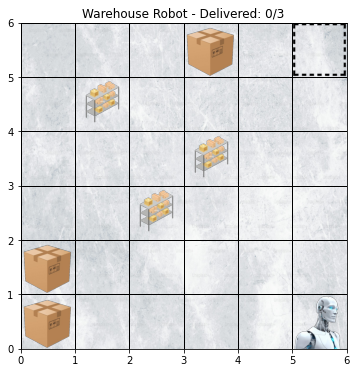



-----------------------------------------------------------------
Step: 1, State: {'agent': array([4, 0], dtype=int32), 'carrying': 0, 'carrying_box': array([-1], dtype=int32), 'boxes': array([[0, 1],
       [0, 0],
       [3, 5]], dtype=int32), 'delivered': array([0, 0, 0], dtype=int32)}, Action: 2, Reward: -1


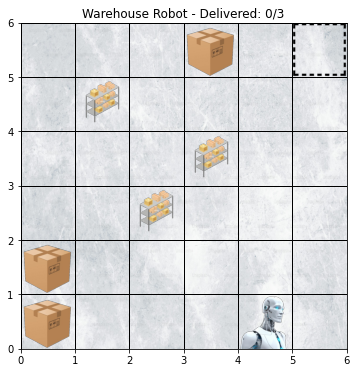

Step: 2, State: {'agent': array([4, 1], dtype=int32), 'carrying': 0, 'carrying_box': array([-1], dtype=int32), 'boxes': array([[0, 1],
       [0, 0],
       [3, 5]], dtype=int32), 'delivered': array([0, 0, 0], dtype=int32)}, Action: 0, Reward: -1


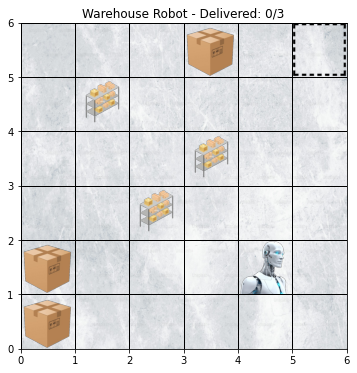

Step: 3, State: {'agent': array([4, 1], dtype=int32), 'carrying': 0, 'carrying_box': array([-1], dtype=int32), 'boxes': array([[0, 1],
       [0, 0],
       [3, 5]], dtype=int32), 'delivered': array([0, 0, 0], dtype=int32)}, Action: 5, Reward: -1


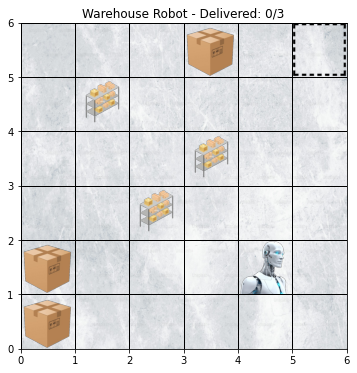

Step: 4, State: {'agent': array([5, 1], dtype=int32), 'carrying': 0, 'carrying_box': array([-1], dtype=int32), 'boxes': array([[0, 1],
       [0, 0],
       [3, 5]], dtype=int32), 'delivered': array([0, 0, 0], dtype=int32)}, Action: 3, Reward: -1


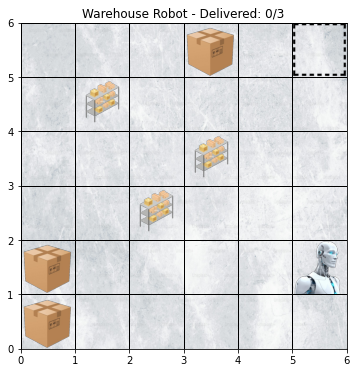

Step: 5, State: {'agent': array([5, 2], dtype=int32), 'carrying': 0, 'carrying_box': array([-1], dtype=int32), 'boxes': array([[0, 1],
       [0, 0],
       [3, 5]], dtype=int32), 'delivered': array([0, 0, 0], dtype=int32)}, Action: 0, Reward: -1


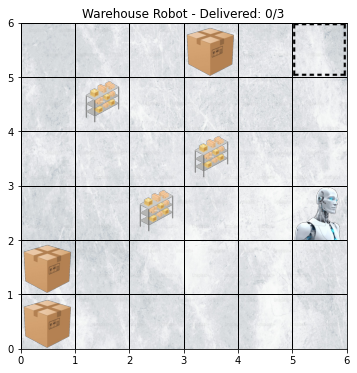

Step: 6, State: {'agent': array([5, 2], dtype=int32), 'carrying': 0, 'carrying_box': array([-1], dtype=int32), 'boxes': array([[0, 1],
       [0, 0],
       [3, 5]], dtype=int32), 'delivered': array([0, 0, 0], dtype=int32)}, Action: 4, Reward: -1


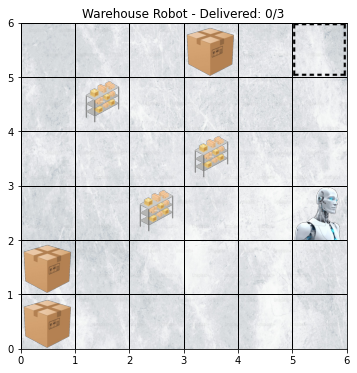

Step: 7, State: {'agent': array([5, 2], dtype=int32), 'carrying': 0, 'carrying_box': array([-1], dtype=int32), 'boxes': array([[0, 1],
       [0, 0],
       [3, 5]], dtype=int32), 'delivered': array([0, 0, 0], dtype=int32)}, Action: 4, Reward: -1


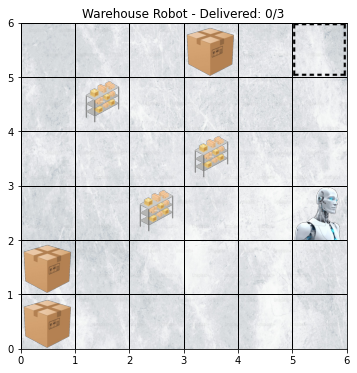

Step: 8, State: {'agent': array([5, 1], dtype=int32), 'carrying': 0, 'carrying_box': array([-1], dtype=int32), 'boxes': array([[0, 1],
       [0, 0],
       [3, 5]], dtype=int32), 'delivered': array([0, 0, 0], dtype=int32)}, Action: 1, Reward: -1


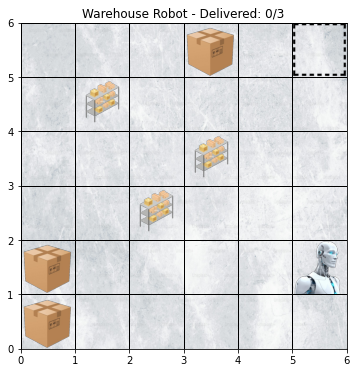

Step: 9, State: {'agent': array([5, 1], dtype=int32), 'carrying': 0, 'carrying_box': array([-1], dtype=int32), 'boxes': array([[0, 1],
       [0, 0],
       [3, 5]], dtype=int32), 'delivered': array([0, 0, 0], dtype=int32)}, Action: 4, Reward: -1


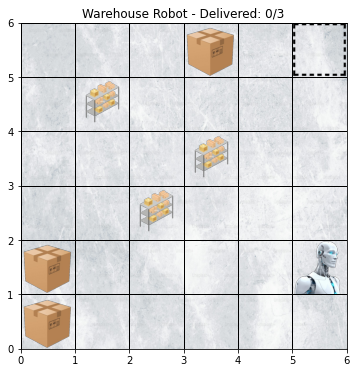

Step: 10, State: {'agent': array([5, 1], dtype=int32), 'carrying': 0, 'carrying_box': array([-1], dtype=int32), 'boxes': array([[0, 1],
       [0, 0],
       [3, 5]], dtype=int32), 'delivered': array([0, 0, 0], dtype=int32)}, Action: 5, Reward: -1


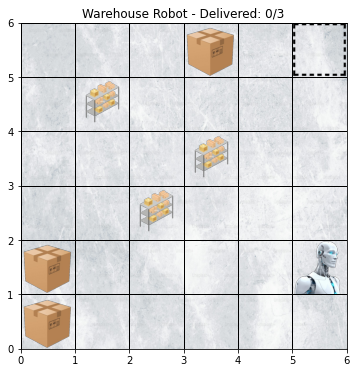

In [63]:
print("------------Bonus Environment-----------")
env = WarehouseRobotMultiBoxEnv()
run_environment(env ,10)

Running environment...


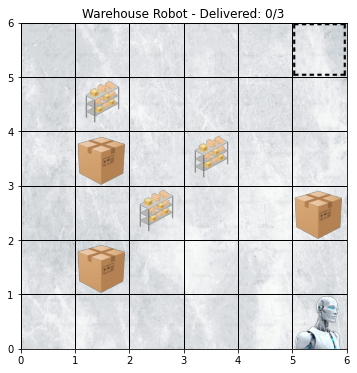

Step: 1, State: {'agent': array([4, 0], dtype=int32), 'carrying': 0, 'carrying_box': array([-1], dtype=int32), 'boxes': array([[1, 1],
       [5, 2],
       [1, 3]], dtype=int32), 'delivered': array([0, 0, 0], dtype=int32)}, Action: 2, Reward: -1


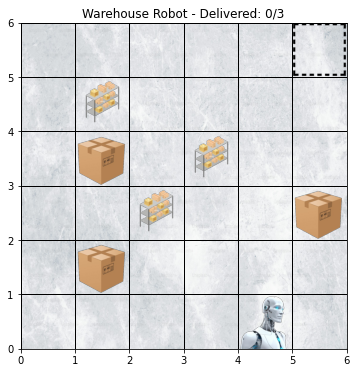

Step: 2, State: {'agent': array([3, 0], dtype=int32), 'carrying': 0, 'carrying_box': array([-1], dtype=int32), 'boxes': array([[1, 1],
       [5, 2],
       [1, 3]], dtype=int32), 'delivered': array([0, 0, 0], dtype=int32)}, Action: 2, Reward: -1


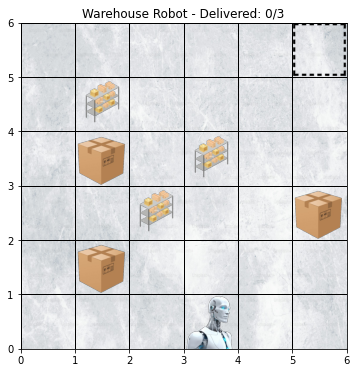

Step: 3, State: {'agent': array([4, 0], dtype=int32), 'carrying': 0, 'carrying_box': array([-1], dtype=int32), 'boxes': array([[1, 1],
       [5, 2],
       [1, 3]], dtype=int32), 'delivered': array([0, 0, 0], dtype=int32)}, Action: 3, Reward: -1


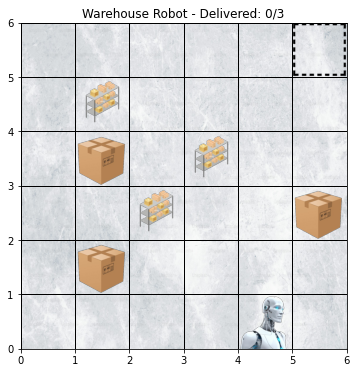

Step: 4, State: {'agent': array([5, 0], dtype=int32), 'carrying': 0, 'carrying_box': array([-1], dtype=int32), 'boxes': array([[1, 1],
       [5, 2],
       [1, 3]], dtype=int32), 'delivered': array([0, 0, 0], dtype=int32)}, Action: 3, Reward: -1


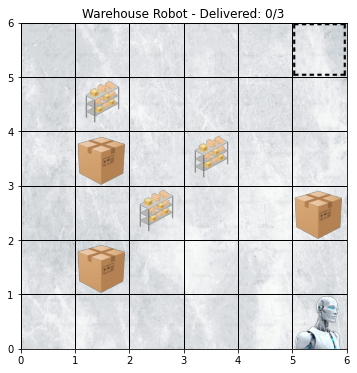

Step: 5, State: {'agent': array([4, 0], dtype=int32), 'carrying': 0, 'carrying_box': array([-1], dtype=int32), 'boxes': array([[1, 1],
       [5, 2],
       [1, 3]], dtype=int32), 'delivered': array([0, 0, 0], dtype=int32)}, Action: 2, Reward: -1


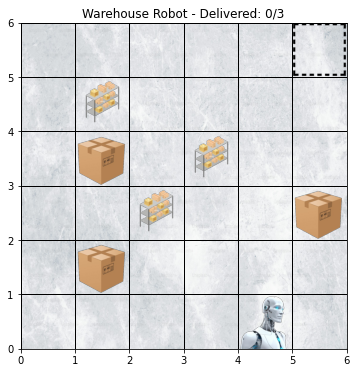

Step: 6, State: {'agent': array([4, 0], dtype=int32), 'carrying': 0, 'carrying_box': array([-1], dtype=int32), 'boxes': array([[1, 1],
       [5, 2],
       [1, 3]], dtype=int32), 'delivered': array([0, 0, 0], dtype=int32)}, Action: 1, Reward: -1


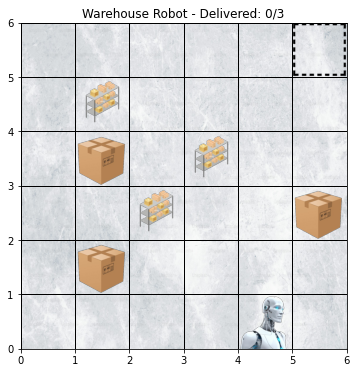

Step: 7, State: {'agent': array([5, 0], dtype=int32), 'carrying': 0, 'carrying_box': array([-1], dtype=int32), 'boxes': array([[1, 1],
       [5, 2],
       [1, 3]], dtype=int32), 'delivered': array([0, 0, 0], dtype=int32)}, Action: 3, Reward: -1


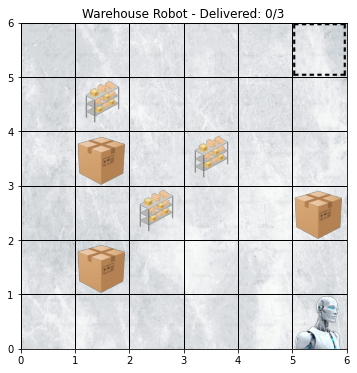

Step: 8, State: {'agent': array([5, 1], dtype=int32), 'carrying': 0, 'carrying_box': array([-1], dtype=int32), 'boxes': array([[1, 1],
       [5, 2],
       [1, 3]], dtype=int32), 'delivered': array([0, 0, 0], dtype=int32)}, Action: 0, Reward: -1


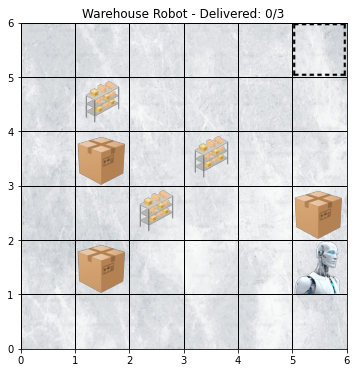

Step: 9, State: {'agent': array([4, 1], dtype=int32), 'carrying': 0, 'carrying_box': array([-1], dtype=int32), 'boxes': array([[1, 1],
       [5, 2],
       [1, 3]], dtype=int32), 'delivered': array([0, 0, 0], dtype=int32)}, Action: 2, Reward: -1


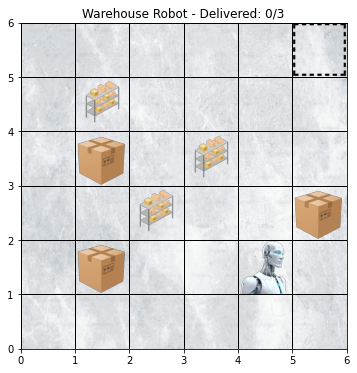

Step: 10, State: {'agent': array([4, 0], dtype=int32), 'carrying': 0, 'carrying_box': array([-1], dtype=int32), 'boxes': array([[1, 1],
       [5, 2],
       [1, 3]], dtype=int32), 'delivered': array([0, 0, 0], dtype=int32)}, Action: 1, Reward: -1


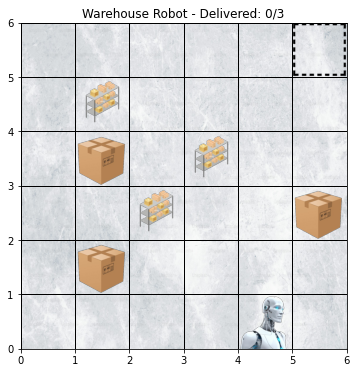

Step: 11, State: {'agent': array([4, 1], dtype=int32), 'carrying': 0, 'carrying_box': array([-1], dtype=int32), 'boxes': array([[1, 1],
       [5, 2],
       [1, 3]], dtype=int32), 'delivered': array([0, 0, 0], dtype=int32)}, Action: 0, Reward: -1


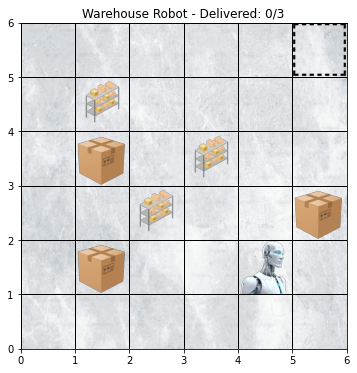

Step: 12, State: {'agent': array([4, 2], dtype=int32), 'carrying': 0, 'carrying_box': array([-1], dtype=int32), 'boxes': array([[1, 1],
       [5, 2],
       [1, 3]], dtype=int32), 'delivered': array([0, 0, 0], dtype=int32)}, Action: 0, Reward: -1


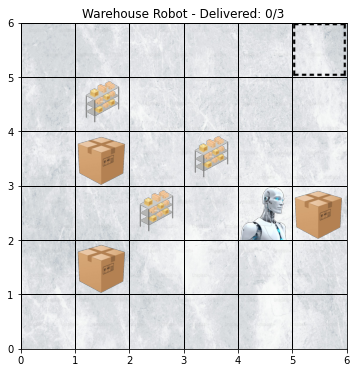

Step: 13, State: {'agent': array([3, 2], dtype=int32), 'carrying': 0, 'carrying_box': array([-1], dtype=int32), 'boxes': array([[1, 1],
       [5, 2],
       [1, 3]], dtype=int32), 'delivered': array([0, 0, 0], dtype=int32)}, Action: 2, Reward: -1


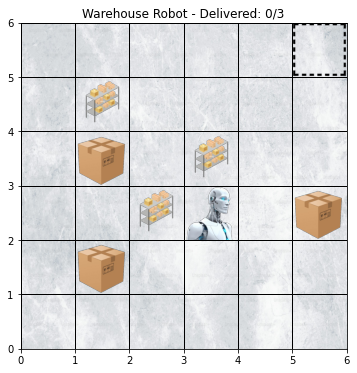

Step: 14, State: {'agent': array([3, 2], dtype=int32), 'carrying': 0, 'carrying_box': array([-1], dtype=int32), 'boxes': array([[1, 1],
       [5, 2],
       [1, 3]], dtype=int32), 'delivered': array([0, 0, 0], dtype=int32)}, Action: 2, Reward: -20


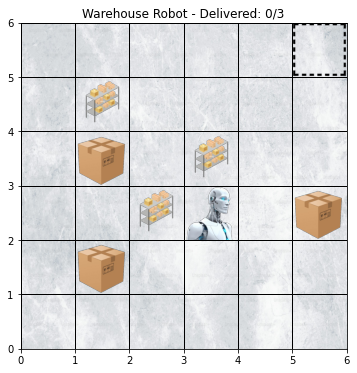

Step: 15, State: {'agent': array([3, 1], dtype=int32), 'carrying': 0, 'carrying_box': array([-1], dtype=int32), 'boxes': array([[1, 1],
       [5, 2],
       [1, 3]], dtype=int32), 'delivered': array([0, 0, 0], dtype=int32)}, Action: 1, Reward: -1


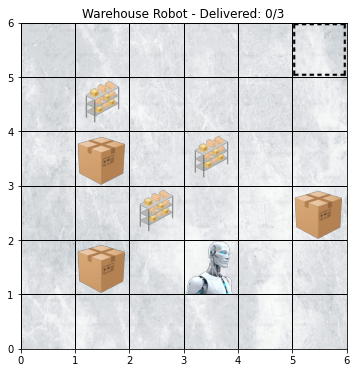

Step: 16, State: {'agent': array([4, 1], dtype=int32), 'carrying': 0, 'carrying_box': array([-1], dtype=int32), 'boxes': array([[1, 1],
       [5, 2],
       [1, 3]], dtype=int32), 'delivered': array([0, 0, 0], dtype=int32)}, Action: 3, Reward: -1


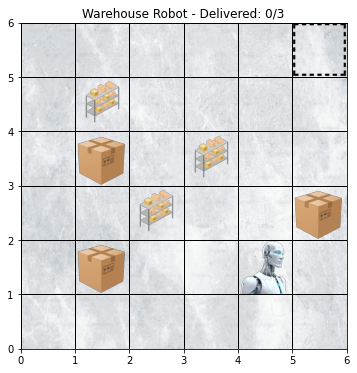

Step: 17, State: {'agent': array([5, 1], dtype=int32), 'carrying': 0, 'carrying_box': array([-1], dtype=int32), 'boxes': array([[1, 1],
       [5, 2],
       [1, 3]], dtype=int32), 'delivered': array([0, 0, 0], dtype=int32)}, Action: 3, Reward: -1


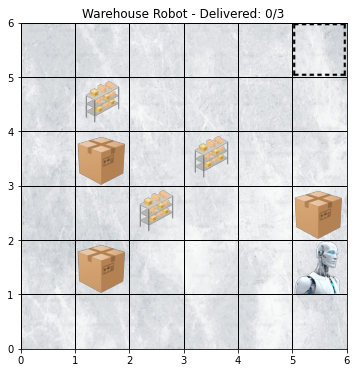

Step: 18, State: {'agent': array([4, 1], dtype=int32), 'carrying': 0, 'carrying_box': array([-1], dtype=int32), 'boxes': array([[1, 1],
       [5, 2],
       [1, 3]], dtype=int32), 'delivered': array([0, 0, 0], dtype=int32)}, Action: 2, Reward: -1


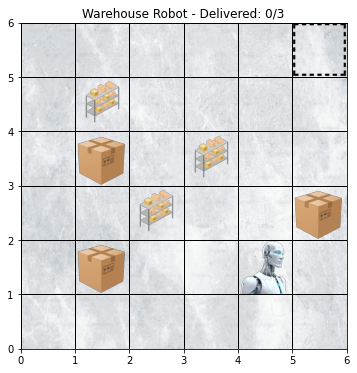

In [64]:
#Debugger use to find all actions and it's output
action_s = (2,2,3,3,2,1,3,0,2,1,0,0,2,2,1,3,3,2)
env = WarehouseRobotMultiBoxEnv()

print("Running environment...")
obs = env.reset()
env.render()
i = 0
for step in range(len(action_s)):
    action = action_s[i]
    i = i + 1
    obs, reward, done, _, _ = env.step(action)
    print(f"Step: {step + 1}, State: {obs}, Action: {action}, Reward: {reward}")
    env.render()
    if done:
        print("Episode finished after {} steps".format(step + 1))
        break

## `Part 2: Training the RL Agents`

In [65]:
                                ### ------------------------------- ###
                                #      Q-Learning Implementation      #
                                ### ------------------------------- ###

#Few Helper functions
def train_q_learning(env, num_episodes=500, max_steps_per_episode=100, alpha=0.1, gamma=0.99,
                     epsilon=1.0, epsilon_decay=0.999, min_epsilon=0.01):

    #Initializes the Q-table as an empty dictionary
    Q = {}  
    total_rewards = []
    epsilon_history = []
    initial_Q = {} 

    for episode in range(num_episodes):
        state, _ = env.reset()
       
        #Initializes Q for starting state to zeros 
        if state not in Q:
            Q[state] = np.zeros(env.action_space.n)
        if episode == 0:
            initial_Q = copy.deepcopy(Q)

        total_reward = 0
        for step in range(max_steps_per_episode):
            if state not in Q:
                Q[state] = np.zeros(env.action_space.n)
            
            #Epsilon-greedy action selection
            if np.random.rand() < epsilon:
                action = env.action_space.sample()
            else:
                action = np.argmax(Q[state])
            
            next_state, reward, terminated, truncated, _ = env.step(action)
            total_reward += reward

            if next_state not in Q:
                Q[next_state] = np.zeros(env.action_space.n)
            
            #Q-learning update
            Q[state][action] = Q[state][action] + alpha * (reward + gamma * np.max(Q[next_state]) - Q[state][action])
            state = next_state
            
            if terminated or truncated:
                break
        
        total_rewards.append(total_reward)
        epsilon_history.append(epsilon)
        epsilon = max(min_epsilon, epsilon * epsilon_decay)         #Helps in Epsilon decay
        
    return initial_Q, Q, total_rewards, epsilon_history

def evaluate_policy(env, Q, num_episodes=10, max_steps_per_episode=100):
    
    rewards_list = []
    for episode in range(num_episodes):
        state, _ = env.reset()
        total_reward = 0

        for step in range(max_steps_per_episode):
            #Choose the greedy action(if state is unseen, choose randomly)
            if state not in Q:
                action = env.action_space.sample()
            else:
                action = np.argmax(Q[state])
            
            state, reward, terminated, truncated, _ = env.step(action)
            total_reward += reward

            # env.render()

            if terminated or truncated:
                break
        
        rewards_list.append(total_reward)
    
    return rewards_list

def plot_training_results(total_rewards, epsilon_history, title_suffix=""):
    
    episodes = np.arange(len(total_rewards))

    plt.figure(figsize=(12, 5))

    #Plots the total reward per episode graph
    plt.subplot(1, 2, 1)
    plt.plot(episodes, total_rewards)
    plt.xlabel("Episode")
    plt.ylabel("Total Reward")
    plt.title("Total Reward per Episode " + title_suffix)

    #Plots the epsilon decay graph
    plt.subplot(1, 2, 2)
    plt.plot(episodes, epsilon_history)
    plt.xlabel("Episode")
    plt.ylabel("Epsilon")
    plt.title("Epsilon Decay " + title_suffix)

    plt.tight_layout()
    plt.show()

### Training the RL Agent on both the environments:

In [66]:
#----- Q-learning on Deterministic Environment -----#

print("Training on Deterministic Environment...")
env_det = WarehouseRobotDeterministicEnv()

initial_Q_det, trained_Q_det, rewards_det, epsilons_det = train_q_learning(
    env_det, num_episodes=4000, max_steps_per_episode=100
)

print("Initial Q-table:")
for i, (state, q_values) in enumerate(initial_Q_det.items()):
    print(state, q_values)

print("\nTrained Q-table:")
for i, (state, q_values) in enumerate(trained_Q_det.items()):
    print(state, q_values)


with open('q_table_deterministic.pkl', 'wb') as f: #Saves the trained Q-table as a pickle file
    pickle.dump(trained_Q_det, f)

Training on Deterministic Environment...
Initial Q-table:
((5, 0), (0, 0), 0) [0. 0. 0. 0. 0. 0.]

Trained Q-table:
((5, 0), (0, 0), 0) [64.74476686 77.44768614 94.91740368 76.4014078  75.18086401 80.24493749]
((4, 0), (0, 0), 0) [42.59680917 76.38076051 96.93785422 75.17398477 85.73519318 86.35206876]
((4, 1), (0, 0), 0) [-2.89413218 -2.89938057 71.09798802  5.72390753 -2.83616112  2.07609718]
((3, 1), (0, 0), 0) [-2.36850601 94.72843043 -2.37455671 -2.42703166  4.62534568  3.66959363]
((2, 1), (0, 0), 0) [-13.68201041  77.00268274   1.19855749  -1.86116981  -1.82438071
   1.04031057]
((1, 1), (0, 0), 0) [-1.6108833  97.33556605 -0.12694512  1.37789221  6.39528903 -1.78996096]
((0, 1), (0, 0), 0) [-1.48748197  8.88515223 -1.48509087 69.12390505 -1.60802893  0.38417418]
((0, 2), (0, 0), 0) [-1.56868158 -1.51665291 -1.60103492 -1.49702308 -1.54725954 -1.6320833 ]
((1, 2), (0, 0), 0) [ -1.62725044  -1.62805637  -1.68661082 -15.63003794  -1.63622992
  -1.68095722]
((0, 3), (0, 0), 0) [-1.

((1, 2), (5, 1), 0) [-0.1 -0.1  0.   0.   0.   0. ]
((1, 3), (5, 1), 0) [-2.  -0.1  0.   0.   0.   0. ]
((2, 1), (4, 2), 0) [-2.   -0.19 -0.1   0.    0.    0.  ]
((2, 0), (4, 2), 0) [-0.1  0.   0.   0.   0.  -0.2]
((1, 1), (4, 2), 0) [-0.1 -0.1 -0.1 -0.1  0.   0. ]
((1, 2), (4, 2), 0) [-0.1 -0.1  0.   0.   0.   0. ]
((1, 3), (4, 2), 0) [-2.  -0.1 -0.1 -0.1  0.   0. ]
((1, 0), (4, 2), 0) [-0.1  0.   0.   0.  -0.2  0. ]
((0, 1), (4, 2), 0) [-0.1 -0.1 -0.1 -0.1  0.  -0.2]
((0, 2), (4, 2), 0) [-0.1 -0.1  0.   0.   0.   0. ]
((0, 3), (4, 2), 0) [-0.1 -0.1 -0.1 -0.1  0.   0. ]
((0, 4), (4, 2), 0) [-0.1 -0.1  0.   0.   0.   0. ]
((0, 5), (4, 2), 0) [-0.1 -0.1  0.  -0.1  0.   0. ]
((1, 5), (4, 2), 0) [-0.1 -2.  -0.1 -0.1  0.   0. ]
((0, 0), (4, 2), 0) [-0.1  0.   0.   0.   0.   0. ]
((5, 4), (5, 4), 0) [-0.1        -0.1        -0.1        -0.1        87.12352756  0.        ]
((5, 5), (5, 4), 0) [-0.1 -0.1  0.   0.   0.   0. ]
((5, 3), (5, 4), 0) [-0.1  0.   0.  -0.1  0.   0. ]
((4, 4), (5, 4),

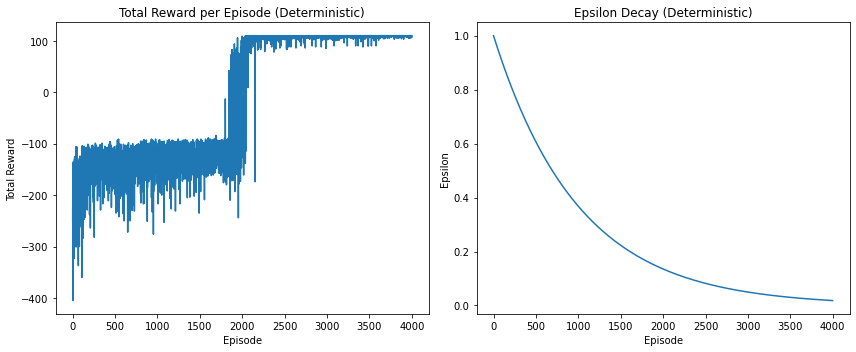

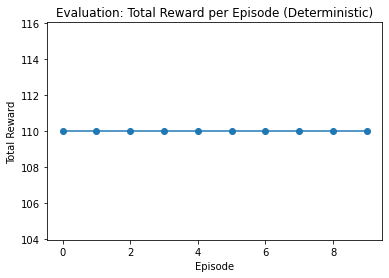

In [67]:
plot_training_results(rewards_det, epsilons_det, title_suffix="(Deterministic)")

eval_rewards_det = evaluate_policy(env_det, trained_Q_det, num_episodes=10)

plt.figure()
plt.plot(np.arange(len(eval_rewards_det)), eval_rewards_det, marker='o')
plt.xlabel("Episode")
plt.ylabel("Total Reward")
plt.title("Evaluation: Total Reward per Episode (Deterministic)")
plt.show()

In [68]:
# ----- Q-learning on Stochastic Environment -----
print("\nTraining on Stochastic Environment...")
env_stoch = WarehouseRobotStochasticEnv()

initial_Q_stoch, trained_Q_stoch, rewards_stoch, epsilons_stoch = train_q_learning(
    env_stoch, num_episodes=4000, max_steps_per_episode=100
)

print("Initial Q-table:")
for i, (state, q_values) in enumerate(initial_Q_stoch.items()):
    print(state, q_values)

print("\nTrained Q-table:")
for i, (state, q_values) in enumerate(trained_Q_stoch.items()):
    print(state, q_values)

with open('q_table_stochastic.pkl', 'wb') as f:
    pickle.dump(trained_Q_stoch, f)



Training on Stochastic Environment...
Initial Q-table:
((5, 0), (0, 0), 0) [0. 0. 0. 0. 0. 0.]

Trained Q-table:
((5, 0), (0, 0), 0) [61.70512413 65.40197147 79.00977046 62.54175998 62.67686866 63.4728154 ]
((5, 1), (0, 0), 0) [-7.36478823 64.10286739  9.44084961 -0.36676994 -0.5461378  10.80024867]
((5, 2), (0, 0), 0) [-7.76798003 24.58916067 -7.69470626 -7.66832579 -7.67080357 -7.66941719]
((5, 3), (0, 0), 0) [-7.71225884 -5.90049817 -7.79807667 -7.73290973 -7.78860471 -7.83613365]
((5, 4), (0, 0), 0) [-7.521057   -7.60740341 -7.55058033 -7.56413255 -7.57387891 -7.61852417]
((4, 3), (0, 0), 0) [ -7.77697872  -8.66254428 -17.65928539  -7.8209806   -7.89902106
  -7.75935754]
((4, 2), (0, 0), 0) [-7.6108966  38.84577569 -1.79627123 -7.60118503 -4.77697163 -7.5540152 ]
((4, 1), (0, 0), 0) [-7.50301286 73.38800025 11.5901071   5.84303958  4.81120094 -0.82670135]
((3, 2), (0, 0), 0) [-17.68792426  29.01913965 -18.99174943  -9.33588007 -10.38403747
  -8.70076237]
((4, 4), (0, 0), 0) [-7.56

((5, 0), (0, 3), 0) [-0.1999 -0.1    -0.1    -0.2    -0.1099 -0.2   ]
((5, 1), (0, 3), 0) [-0.37452549 -0.19       -0.2098     -0.1        -0.2        -0.2       ]
((4, 3), (5, 3), 0) [-0.2        -0.271      -3.84971689 41.1097662  -0.2        -0.2       ]
((1, 5), (3, 1), 0) [-0.58866131 -2.         -0.54511948 -0.59681628 -0.5994002  -0.5994002 ]
((5, 3), (1, 3), 0) [-0.1  0.   0.   0.   0.   0. ]
((3, 1), (1, 3), 0) [-0.1 -0.1  0.   0.   0.   0. ]
((3, 2), (1, 3), 0) [-0.2 -0.1  0.  -0.1  0.   0. ]
((4, 1), (1, 3), 0) [-0.1  0.   0.   0.   0.   0. ]
((3, 0), (1, 3), 0) [-0.2 -0.1 -0.1  0.   0.   0. ]
((5, 1), (5, 3), 0) [-0.1        -0.1         0.36734469  0.          0.          0.        ]
((4, 4), (5, 3), 0) [-0.1        -0.05450286  0.          0.          0.          0.        ]
((4, 5), (5, 2), 0) [-0.1999  -0.2     -0.19    -0.20881 -0.2     -0.2    ]
((3, 5), (5, 2), 0) [-0.1999 -0.19   -0.1    -0.1    -0.2    -0.2   ]
((2, 3), (5, 2), 0) [-0.1 -2.  -0.2 -2.  -0.2  0. ]
((

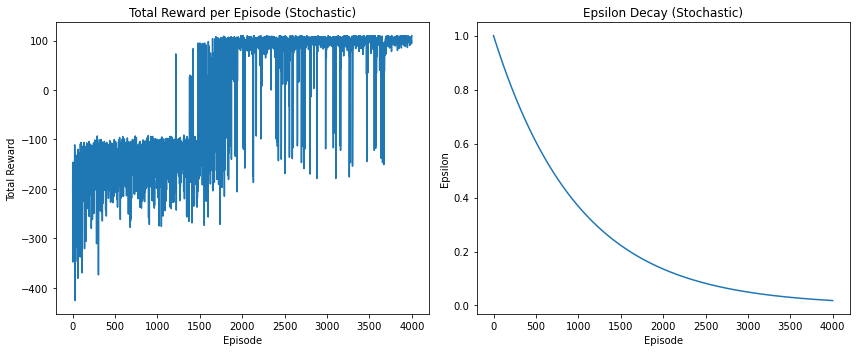

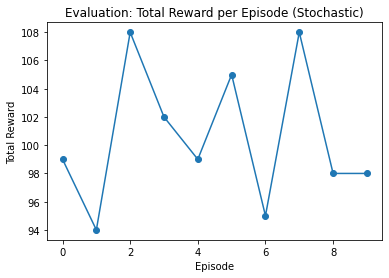

In [69]:
plot_training_results(rewards_stoch, epsilons_stoch, title_suffix="(Stochastic)")

eval_rewards_stoch = evaluate_policy(env_stoch, trained_Q_stoch, num_episodes=10)
plt.figure()
plt.plot(np.arange(len(eval_rewards_stoch)), eval_rewards_stoch, marker='o')
plt.xlabel("Episode")
plt.ylabel("Total Reward")
plt.title("Evaluation: Total Reward per Episode (Stochastic)")
plt.show()

### Hypertuning the Agent on Deterministic Env:

In [70]:
                                ### ------------------------------- ###
                                #        Hypertuning the Agent        #
                                ### ------------------------------- ###

            
def run_tune(env, gamma, epsilon_decay, num_episodes=500, max_steps_per_episode=100, alpha=0.1, min_epsilon=0.01):

    initial_Q, trained_Q, total_rewards, epsilon_history = train_q_learning(
        env=env,
        num_episodes=num_episodes,
        max_steps_per_episode=max_steps_per_episode,
        alpha=alpha,
        gamma=gamma,
        epsilon=1.0,          
        epsilon_decay=epsilon_decay,
        min_epsilon=min_epsilon
    )

    plot_training_results(total_rewards, epsilon_history,
                          title_suffix=f"(gamma={gamma}, decay={epsilon_decay})")

    eval_rewards = evaluate_policy(env, trained_Q, num_episodes=10, max_steps_per_episode=max_steps_per_episode)

    avg_eval_reward = np.mean(eval_rewards)
    print(f"[Evaluation] gamma={gamma}, epsilon_decay={epsilon_decay}, "
          f"Avg Reward over 10 episodes: {avg_eval_reward:.2f}")

    return trained_Q, total_rewards, epsilon_history, eval_rewards

=== Base Model Training ===


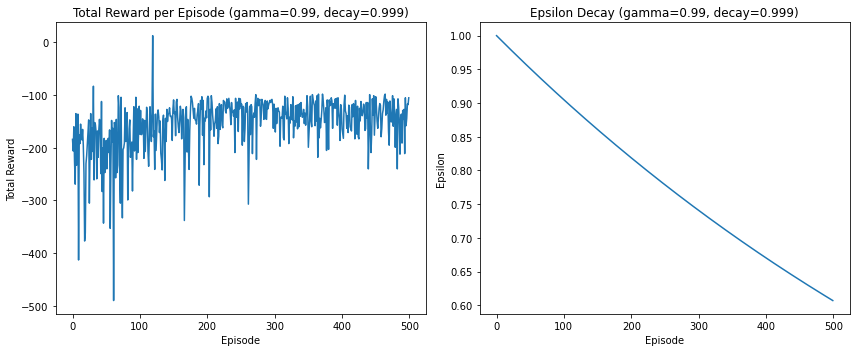

[Evaluation] gamma=0.99, epsilon_decay=0.999, Avg Reward over 10 episodes: -198.00

=== Hyperparameter #1: Discount Factor (gamma) ===


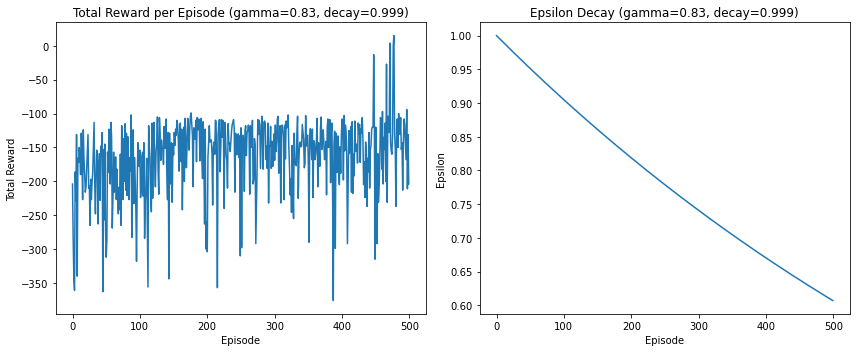

[Evaluation] gamma=0.83, epsilon_decay=0.999, Avg Reward over 10 episodes: -215.00


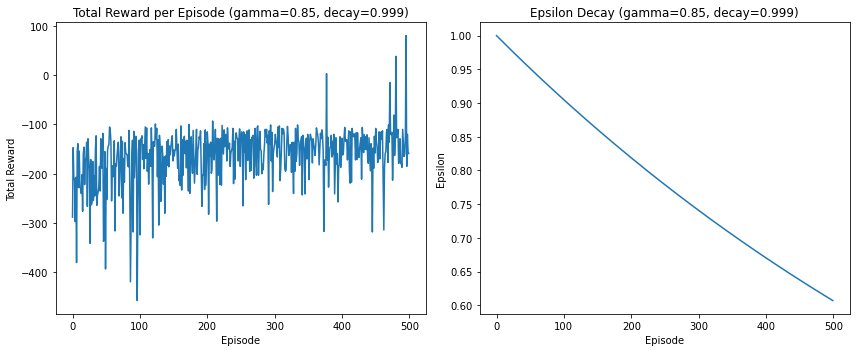

[Evaluation] gamma=0.85, epsilon_decay=0.999, Avg Reward over 10 episodes: -74.00


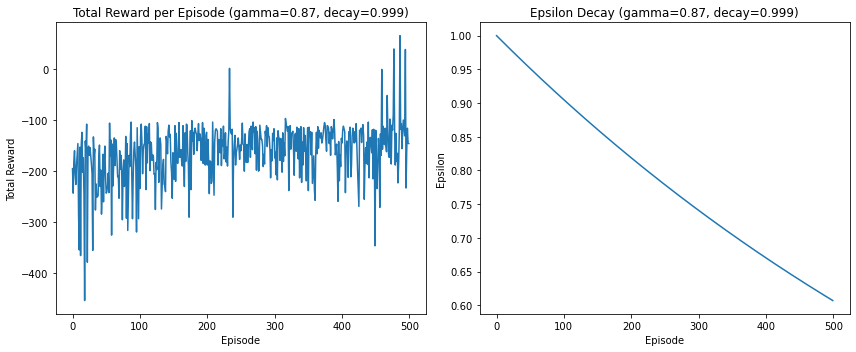

[Evaluation] gamma=0.87, epsilon_decay=0.999, Avg Reward over 10 episodes: -215.00

=== Hyperparameter #2: Epsilon Decay Rate ===


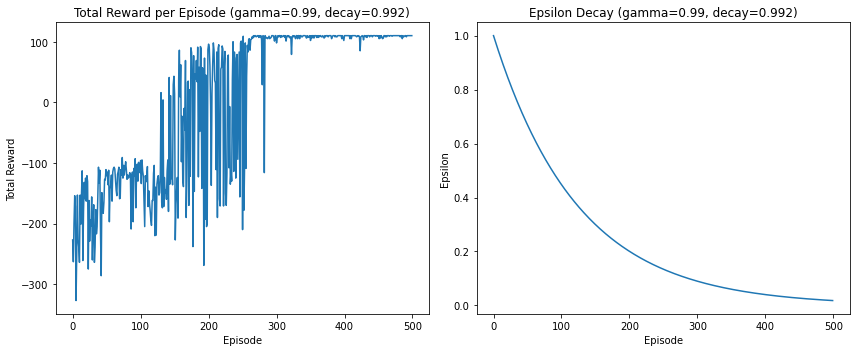

[Evaluation] gamma=0.99, epsilon_decay=0.992, Avg Reward over 10 episodes: 110.00


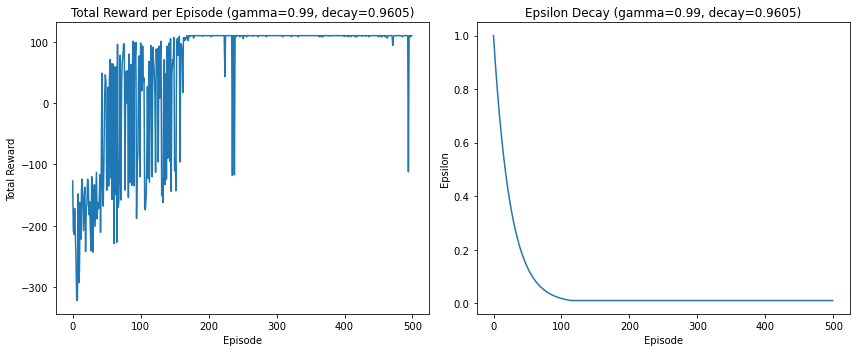

[Evaluation] gamma=0.99, epsilon_decay=0.9605, Avg Reward over 10 episodes: 110.00


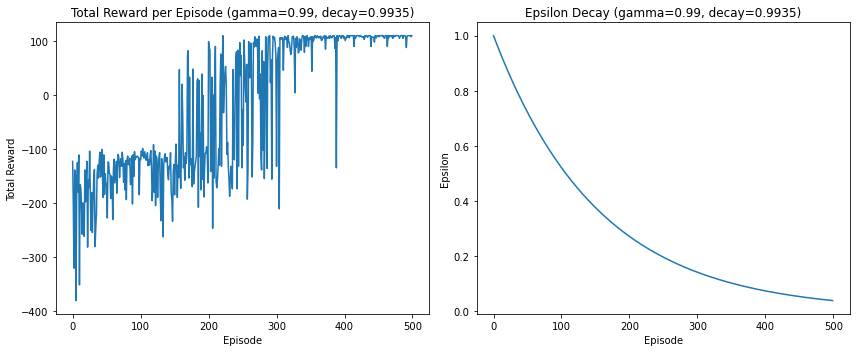

[Evaluation] gamma=0.99, epsilon_decay=0.9935, Avg Reward over 10 episodes: 110.00

=== Hyperparameter Tuning Completed ===


In [71]:
env_det = WarehouseRobotDeterministicEnv()

print("=== Base Model Training ===")

base_gamma = 0.99
base_epsilon_decay = 0.999

base_Q, base_rewards, base_epsilons, base_eval = run_tune(
    env=env_det,
    gamma=base_gamma,
    epsilon_decay=base_epsilon_decay,
    num_episodes=500,
    max_steps_per_episode=100,
    alpha=0.1,
    min_epsilon=0.01
)

# ------------------------------------------------ #
#     Hyperparameter #1: Discount factor (gamma)   #
# ------------------------------------------------ #

gamma_values = [0.83, 0.85, 0.87]  
print("\n=== Hyperparameter #1: Discount Factor (gamma) ===")
for g in gamma_values:
    run_tune(
        env=env_det,
        gamma=g,
        epsilon_decay=base_epsilon_decay,  
        num_episodes=500,
        max_steps_per_episode=100,
        alpha=0.1,
        min_epsilon=0.01
    )

# ------------------------------------------------ #
#     Hyperparameter #2: Epsilon Decay Rate        #
# ------------------------------------------------ #

decay_values = [0.992, 0.9605, 0.9935] 
print("\n=== Hyperparameter #2: Epsilon Decay Rate ===")
for d in decay_values:
    run_tune(
        env=env_det,
        gamma=base_gamma,    
        epsilon_decay=d,
        num_episodes=500,
        max_steps_per_episode=100,
        alpha=0.1,
        min_epsilon=0.01
    )

print("\n=== Hyperparameter Tuning Completed ===")

### After hypertuning the agent:

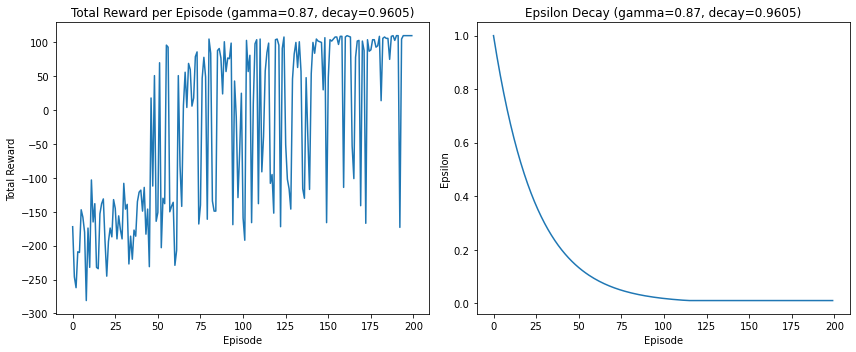

[Evaluation] gamma=0.87, epsilon_decay=0.9605, Avg Reward over 10 episodes: 110.00


In [72]:
improved_Q, improved_rewards, improved_epsilons, improved_eval = run_tune(
    env=env_det,
    gamma=0.87,
    epsilon_decay=0.9605,
    num_episodes=200,
    max_steps_per_episode=100,
    alpha=0.1,
    min_epsilon=0.01
)

### After tuning the agent with the hyper-parameters, it out-performed the base model by just utilizing 200 episodes to learn. Thus, giving faster convergence to the desired output. You can visualize the robot below on how it learnt and is able to apply the policy below.

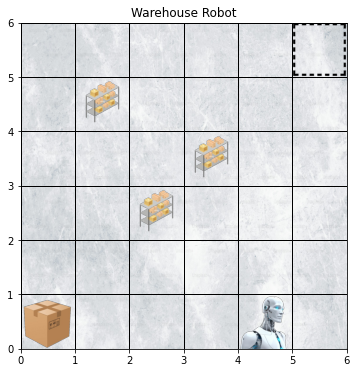

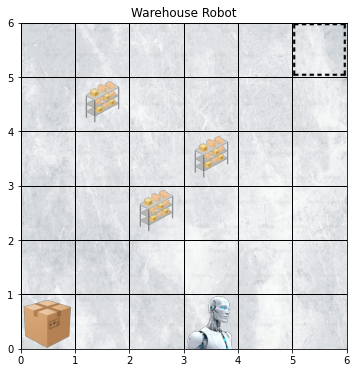

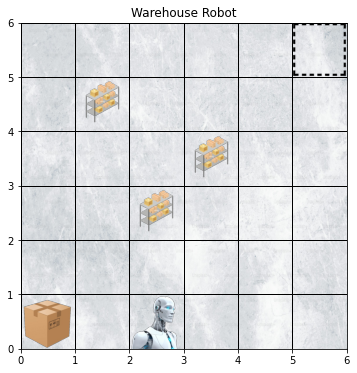

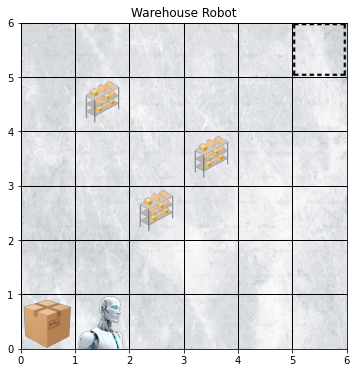

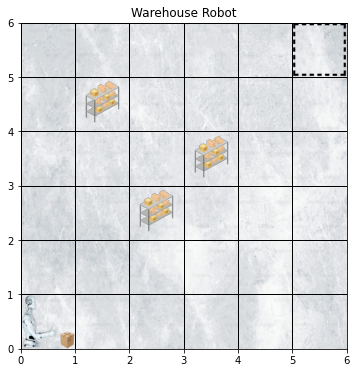

...

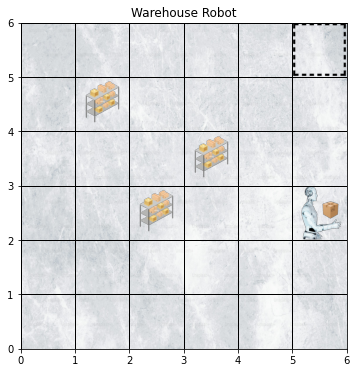

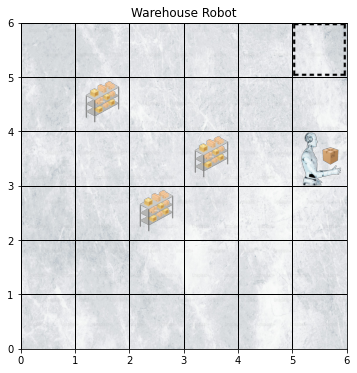

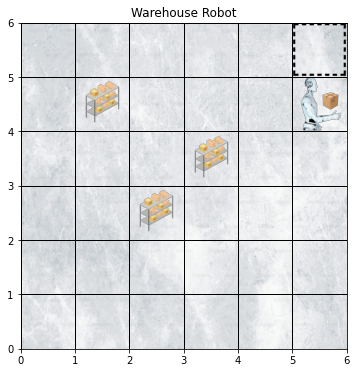

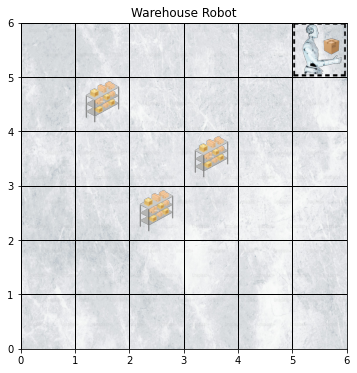

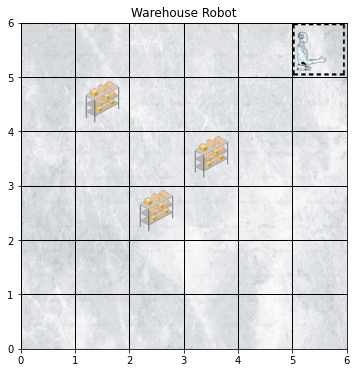

total_reward: 110


In [73]:
def vis(env, Q, num_episodes=1, max_steps_per_episode=100):
    
    for episode in range(num_episodes):
        state, _ = env.reset()
        total_reward = 0

        for step in range(max_steps_per_episode):
            if state not in Q:
                action = env.action_space.sample()
            else:
                action = np.argmax(Q[state])
            
            state, reward, terminated, truncated, _ = env.step(action)
            total_reward += reward

            env.render()

            if terminated or truncated:
                print("total_reward:",total_reward)
                break
vis(env_det,improved_Q)

### `Other tabular method: SARSA`

In [74]:
                                ### ------------------------------- ###
                                #        SARSA Implementation         #
                                ### ------------------------------- ###


def train_sarsa(env, num_episodes=500, max_steps_per_episode=100, alpha=0.1, gamma=0.99,
                epsilon=1.0, epsilon_decay=0.999, min_epsilon=0.01):

    Q = {}  
    total_rewards = []
    epsilon_history = []
    initial_Q = {} 

    for episode in range(num_episodes):
        state, _ = env.reset()
       
        if state not in Q:
            Q[state] = np.zeros(env.action_space.n)
        if np.random.rand() < epsilon:
            action = env.action_space.sample()
        else:
            action = np.argmax(Q[state])
        
        if episode == 0:
            initial_Q = copy.deepcopy(Q)

        total_reward = 0
        for step in range(max_steps_per_episode):
            next_state, reward, terminated, truncated, _ = env.step(action)
            total_reward += reward

            if next_state not in Q:
                Q[next_state] = np.zeros(env.action_space.n)
            
            if np.random.rand() < epsilon:
                next_action = env.action_space.sample()
            else:
                next_action = np.argmax(Q[next_state])
            
            #SARSA update 
            Q[state][action] = Q[state][action] + alpha * (reward + gamma * Q[next_state][next_action] - Q[state][action])
            
            state = next_state
            action = next_action
            
            if terminated or truncated:
                break
        
        total_rewards.append(total_reward)
        epsilon_history.append(epsilon)
        epsilon = max(min_epsilon, epsilon * epsilon_decay)        
    
    return initial_Q, Q, total_rewards, epsilon_history

# ------------------ SARSA on Deterministic Env ------------------ #

print("Training SARSA on Deterministic Environment...")

initial_Q_det_sar, trained_Q_det_sar, rewards_det_sar, epsilons_det_sar = train_sarsa(
    env=env_det,
    num_episodes=4000,
    max_steps_per_episode=100,
    alpha=0.1,
    gamma=0.99,
    epsilon=1.0,
    epsilon_decay=0.999,
    min_epsilon=0.01
)

print("Initial Q-table:")
for i, (state, q_values) in enumerate(initial_Q_det_sar.items()):
    print(state, q_values)

print("\nTrained Q-table:")
for i, (state, q_values) in enumerate(trained_Q_det_sar.items()):
    print(state, q_values)

with open('sarsa_q_table_deterministic.pkl', 'wb') as f:
    pickle.dump(trained_Q_det_sar, f)

Training SARSA on Deterministic Environment...
Initial Q-table:
((5, 0), (0, 0), 0) [0. 0. 0. 0. 0. 0.]

Trained Q-table:
((5, 0), (0, 0), 0) [39.14065996 69.2719126  87.06574819 69.78892806 62.90125368 68.59536006]
((4, 0), (0, 0), 0) [54.65073107 78.11877483 91.61912376 69.69373706 64.36612243 60.29810455]
((4, 1), (0, 0), 0) [-20.52630022  77.06033448 -13.13281929 -16.83463896 -20.44839101
  -4.57309581]
((3, 0), (0, 0), 0) [57.9506675  78.94548914 95.04789185 62.11886187 73.45378822 75.20603883]
((3, 1), (0, 0), 0) [-22.32420801  76.93902643 -13.52191592 -17.33576488 -17.62321664
  -9.07266488]
((2, 1), (0, 0), 0) [-21.83381449  78.55749243  -3.39850954 -15.58698516 -16.02416106
  -4.6774323 ]
((5, 1), (0, 0), 0) [-20.922441    60.63426443 -15.38572647 -17.14219594 -20.38101711
 -19.95290682]
((5, 2), (0, 0), 0) [-20.51441832 -18.63860993 -21.35178541 -20.50964758 -21.28080423
 -21.02443387]
((5, 3), (0, 0), 0) [-20.03754957 -20.14058004 -20.65662607 -20.08732682 -20.55923777
 -20.

((4, 2), (1, 5), 0) [-0.1099 -0.1    -0.1     0.     -0.2     0.    ]
((3, 2), (1, 5), 0) [-2.        -0.1       -3.8198    -0.1       -0.7378418 -0.419402 ]
((5, 1), (1, 5), 0) [-0.11530917 -0.1        -0.1         0.          0.         -0.2       ]
((3, 4), (4, 3), 0) [-0.47408792 -5.45600532 -0.44898328 -0.3888262  -0.40958219 -0.94511989]
((3, 5), (4, 3), 0) [-0.65301118 -0.3986083  -0.39931317 -0.39193044 -1.08433685 -0.3899    ]
((2, 4), (4, 3), 0) [-0.37356943 -0.37348219 -2.         -0.68104107 -0.38       -0.60356107]
((2, 3), (4, 3), 0) [-0.21253252 -2.0198     -0.297829   -3.8099     -0.55982    -0.4195802 ]
((2, 5), (4, 3), 0) [-0.48014145 -0.3966571  -0.41008127 -0.39743316 -0.39881    -0.3899    ]
((1, 5), (4, 3), 0) [-0.2107801  -3.8099     -0.2809     -0.41540304 -0.38891    -0.3899    ]
((0, 5), (4, 3), 0) [-0.21067219 -0.2008801  -0.1999     -0.485929   -0.2099     -0.2       ]
((5, 5), (4, 3), 0) [-0.40938603 -0.44670315 -0.44792353 -0.4544807  -1.29992821 -0.665641

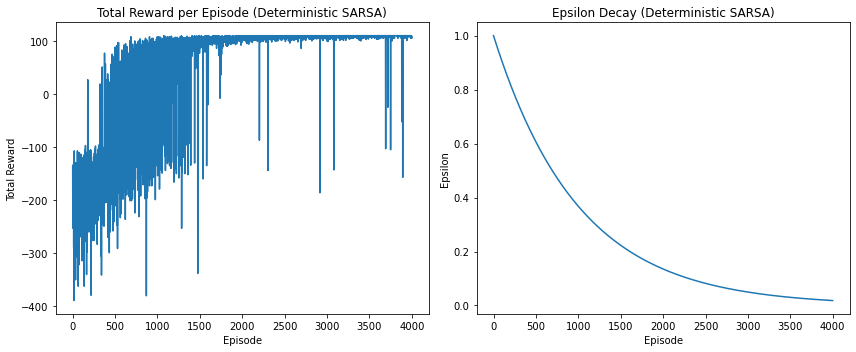

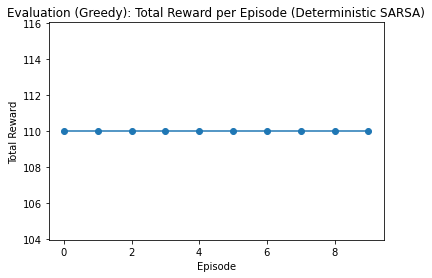

In [75]:
plot_training_results(rewards_det_sar, epsilons_det_sar, title_suffix="(Deterministic SARSA)")

eval_rewards_det_sar = evaluate_policy(env_det, trained_Q_det_sar, num_episodes=10)
plt.figure()
plt.plot(np.arange(len(eval_rewards_det)), eval_rewards_det, marker='o')
plt.xlabel("Episode")
plt.ylabel("Total Reward")
plt.title("Evaluation (Greedy): Total Reward per Episode (Deterministic SARSA)")
plt.show()

In [76]:
# ------------------ SARSA on Stochastic Env ------------------ #

print("\nTraining SARSA on Stochastic Environment...")

initial_Q_stoch_sar, trained_Q_stoch_sar, rewards_stoch_sar, epsilons_stoch_sar = train_sarsa(
    env=env_stoch,
    num_episodes=4000,
    max_steps_per_episode=100,
    alpha=0.1,
    gamma=0.99,
    epsilon=1.0,
    epsilon_decay=0.999,
    min_epsilon=0.01
)

print("Initial Q-table:")
for i, (state, q_values) in enumerate(initial_Q_stoch_sar.items()):
    print(state, q_values)

print("\nTrained Q-table:")
for i, (state, q_values) in enumerate(trained_Q_stoch_sar.items()):
    print(state, q_values)

with open('sarsa_q_table_stochastic.pkl', 'wb') as f:
    pickle.dump(trained_Q_stoch_sar, f)


Training SARSA on Stochastic Environment...
Initial Q-table:
((5, 0), (0, 0), 0) [0. 0. 0. 0. 0. 0.]

Trained Q-table:
((5, 0), (0, 0), 0) [19.23594008 48.29047893 71.93032772 36.36524937 53.82353676 48.5547288 ]
((4, 0), (0, 0), 0) [41.16539754 41.84604278 74.22339742 47.55107052 39.69696151 42.8827234 ]
((3, 0), (0, 0), 0) [42.42917315 61.39386926 77.01876011 57.57639368 55.89575374 55.89458462]
((2, 0), (0, 0), 0) [50.06170158 55.88978379 78.65716678 61.47188905 61.01749211 54.23374023]
((2, 1), (0, 0), 0) [-23.79105937  74.19536159  -1.83340062  -6.02326339 -10.90915654
  -3.79108042]
((1, 0), (0, 0), 0) [53.3422139  63.60130839 81.87965674 63.27135243 57.88058024 60.46649102]
((1, 1), (0, 0), 0) [-14.36033045  78.7513501    2.10199501 -11.71981754   0.8163177
  -3.85514413]
((0, 1), (0, 0), 0) [ 2.7240538  80.08803653 11.1445127  10.63608221  0.26197869  1.93858277]
((0, 2), (0, 0), 0) [-15.09988188  14.2893369  -13.0166054  -18.37746436 -13.5305675
 -11.86883964]
((1, 2), (0, 0)

((5, 3), (3, 4), 0) [-0.19   -0.1999 -0.1099 -0.19   -0.2    -0.3899]
((5, 4), (1, 3), 0) [-0.19       -0.23045161 -0.20881    -0.19       -0.1099     -0.3186001 ]
((5, 5), (1, 3), 0) [-0.28       -0.1099     -0.12348253  0.          0.          0.        ]
((4, 4), (5, 4), 0) [-0.19       -0.71401181  5.91446302 49.50687068 -0.56081    -0.2386001 ]
((4, 3), (5, 4), 0) [-0.3986101  -0.4534561  -5.45750318  1.94421066 -0.60049754 -0.38      ]
((5, 2), (5, 4), 0) [-0.11594125 -0.271      -0.361      -0.1999     -0.22871    -0.2       ]
((4, 2), (5, 4), 0) [-0.29969119 -0.1         0.         -0.28981    -0.3997901  -0.2099    ]
((5, 1), (5, 4), 0) [-0.2267191 -0.19      -0.19      -0.2899    -0.2099    -0.2      ]
((3, 4), (5, 4), 0) [-0.28       -0.69003429 -0.40779209 -2.00265799 -0.2198      0.        ]
((4, 1), (5, 4), 0) [-0.1099     -0.1        -0.1        -0.20176219 -0.38       -0.2999    ]
((1, 5), (3, 0), 0) [-4.55446145 -5.60251877 -3.58698271 -4.238916   -4.39367724 -3.928925

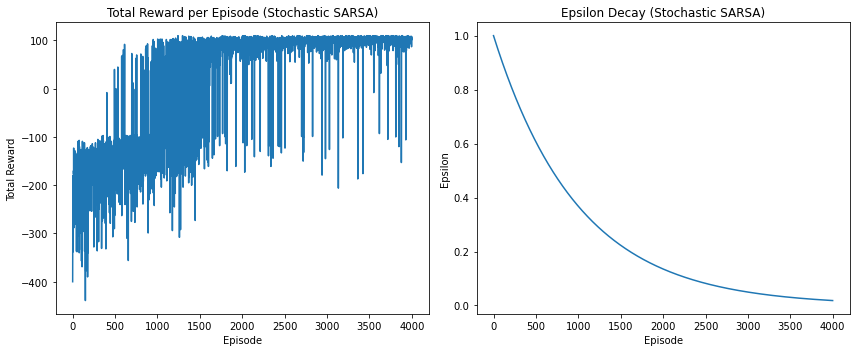

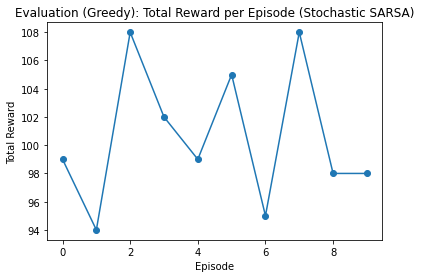

In [77]:
plot_training_results(rewards_stoch_sar, epsilons_stoch_sar, title_suffix="(Stochastic SARSA)")

eval_rewards_stoch_sar = evaluate_policy(env_stoch, trained_Q_stoch_sar, num_episodes=10)
plt.figure()
plt.plot(np.arange(len(eval_rewards_stoch)), eval_rewards_stoch, marker='o')
plt.xlabel("Episode")
plt.ylabel("Total Reward")
plt.title("Evaluation (Greedy): Total Reward per Episode (Stochastic SARSA)")
plt.show()

### Comparision btw the 2 Algorithms: 

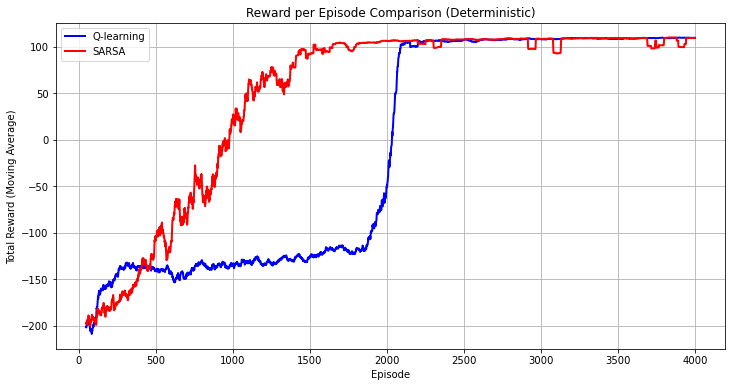

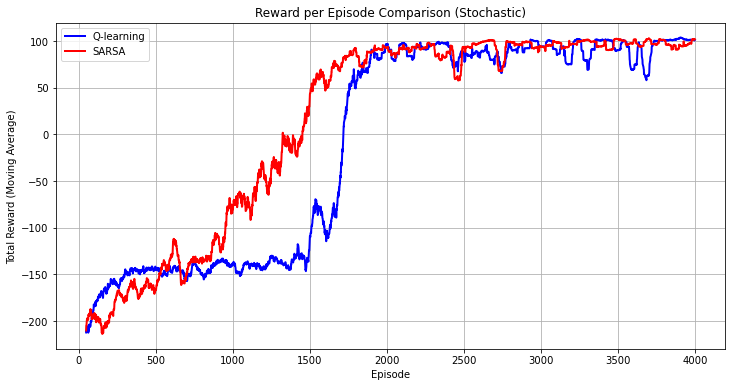

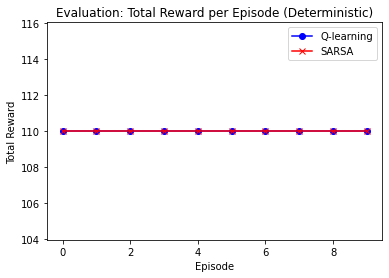

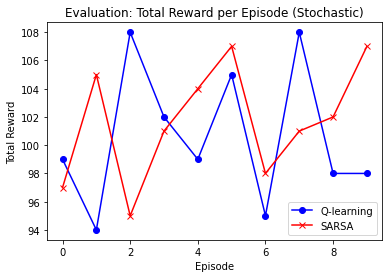

In [78]:
def plot_comparison_rewards(rewards_q, rewards_sarsa, title_suffix=""):
    episodes = np.arange(len(rewards_q))
    window = 50  
    if len(rewards_q) >= window:
        rewards_q_smooth = np.convolve(rewards_q, np.ones(window)/window, mode='valid')
        rewards_sarsa_smooth = np.convolve(rewards_sarsa, np.ones(window)/window, mode='valid')
        episodes_smooth = episodes[window-1:]
    else:
        rewards_q_smooth = rewards_q
        rewards_smooth = rewards_sarsa
        episodes_smooth = episodes

    plt.figure(figsize=(12, 6))
    plt.plot(episodes_smooth, rewards_q_smooth, label="Q-learning", color='blue', linewidth=2)
    plt.plot(episodes_smooth, rewards_sarsa_smooth, label="SARSA", color='red', linewidth=2)
    plt.xlabel("Episode")
    plt.ylabel("Total Reward (Moving Average)")
    plt.title("Reward per Episode Comparison " + title_suffix)
    plt.legend(loc="best")
    plt.grid(True)
    plt.show()

def plot_evaluation_comparison(eval_rewards_q, eval_rewards_sarsa, title_suffix=""):
    plt.figure()
    episodes_q = np.arange(len(eval_rewards_q))
    episodes_sarsa = np.arange(len(eval_rewards_sarsa))
    plt.plot(episodes_q, eval_rewards_q, marker='o', linestyle='-',color='blue', label='Q-learning')
    plt.plot(episodes_sarsa, eval_rewards_sarsa, marker='x', linestyle='-',color='red', label='SARSA')
    plt.xlabel("Episode")
    plt.ylabel("Total Reward")
    plt.title("Evaluation: Total Reward per Episode " + title_suffix)
    plt.legend()
    plt.show()

plot_comparison_rewards(rewards_det, rewards_det_sar, title_suffix="(Deterministic)")
plot_comparison_rewards(rewards_stoch, rewards_stoch_sar, title_suffix="(Stochastic)")
plot_evaluation_comparison(eval_rewards_det, eval_rewards_det_sar, title_suffix="(Deterministic)")
plot_evaluation_comparison(eval_rewards_stoch, eval_rewards_stoch_sar, title_suffix="(Stochastic)")